### PCA by Electrode Groupings

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import fastparquet, pyarrow
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

### PCA for Dimensionality Reduction and Denoising  
  
EEG PCA will be done in different ways across multiple notebooks. These are first attempts at different ways of using PCA to reduce EEG dimensions and remove EEG noise.  
  
When I worked with this dataset last semester, I used PCA to reduce 20 columns to 8 principal components, but I didn't know the importance of location information and I wasn't familiar with methods for EEG denoising. I know that method was insufficient for removing power line noise because when I plotted the results of the Welch transformation I did on the resulting principal components, the power spectrum was showing spikes at 60 Hz in almost every component for almost every EEG. I don't expect different PCA methods to handle that. I expect that I will need to combine another denoising method like notch filtering to handle power line noise after doing PCA.  
  
The issue with location information is that the difference between lateralized and generalized activity is the location of the activity. Lateralized activity is predominantly in one hemisphere (it can be contained in all regions of the brain, but it will be more in one hemisphere). Generalized activity is more evenly spread throughout. Location is also relevant to seizure activity.  
  
The columns for my EEGs correspond to 20 different electrodes. 19 scalp electrodes and 1 electrode for the EKG. These are labeled for their region of the brain and which hemisphere (left or right) they are in. The reduction of these 20 columns to 8 principal components with PCA loses that location information. The purpose of this notebook is doing PCA without losing location information.  
  
This will be done by grouping the 19 scalp electrodes in different ways and then doing PCA on those groups. This retains location information while using PCA to reduce the number of columns and remove noise.  
  
After doing PCA on each different grouping, the resulting signals and power spectrums will be plotted to get an idea of how these PCA methods affected the signals and power spectrum. I will also compare the resulting band power results within the four relevant frequency bands (theta, delta, alpha, beta) by activity type to see if there is significant difference between activity types and to see if preserving the location information improved the effectiveness of these features.  
  
A note: The metadata used is for all EEGs and spectrograms without missing values. The goal is to get a first look at doing PCA with these different electrode groupings. Nothing here is finalized.

In [3]:
df = pd.read_csv('working_data.csv')

##### Target Variable Distribution for Dataframe without EEGs and Spectrograms Missing Values

In [4]:
df['expert_consensus'].value_counts(normalize = True)

expert_consensus
Seizure    0.209216
Other      0.189732
GPD        0.157017
GRDA       0.155822
LRDA       0.146853
LPD        0.141360
Name: proportion, dtype: float64

In [5]:
df.head()

,eeg_id,eeg_sub_id,eeg_label_offset_seconds,spectrogram_id,spectrogram_sub_id,spectrogram_label_offset_seconds,label_id,patient_id,expert_consensus,seizure_vote,lpd_vote,gpd_vote,lrda_vote,grda_vote,other_vote,row
0,1628180742,0,0.0,353733,0,0.0,127492639,42516,Seizure,3,0,0,0,0,0,0
1,1628180742,1,6.0,353733,1,6.0,3887563113,42516,Seizure,3,0,0,0,0,0,1
2,1628180742,2,8.0,353733,2,8.0,1142670488,42516,Seizure,3,0,0,0,0,0,2
3,1628180742,3,18.0,353733,3,18.0,2718991173,42516,Seizure,3,0,0,0,0,0,3
4,1628180742,4,24.0,353733,4,24.0,3080632009,42516,Seizure,3,0,0,0,0,0,4


##### Splitting Dataframe by Activity Type

In [6]:
def activity_df(activity):
    return pd.DataFrame(df[df['expert_consensus'] == activity]).reset_index().drop(columns = 'index')

In [7]:
seizure_df = activity_df('Seizure')
lpd_df = activity_df('LPD')
gpd_df = activity_df('GPD')
lrda_df = activity_df('LRDA')
grda_df = activity_df('GRDA')
other_df = activity_df('Other')

##### Function to Read and Scale Sub EEGs

In [8]:
def scale(df, row):
    eeg = pd.read_parquet('train_eegs/{}.parquet'.format(df['eeg_id'][row]), engine = 'pyarrow')
    first_row = int(df['eeg_label_offset_seconds'][row] * 200)
    last_row = int(first_row + 10000)
    sub_eeg = eeg[first_row: last_row]
    electrodes = sub_eeg.columns
    scaler = StandardScaler()
    sub_eeg = scaler.fit_transform(sub_eeg)
    sub_eeg = pd.DataFrame(sub_eeg, columns = electrodes)
    return sub_eeg

##### Function for Plotting EEG Signals

In [9]:
def activity_signal_plots(sub_eegs, activities, electrodes, h, w):
    fig, axs = plt.subplots(len(electrodes), len(sub_eegs))
    fig.set_figheight(h)
    fig.set_figwidth(w)
    fig.tight_layout()
    for i in range(len(electrodes)):
        if len(sub_eegs) == 1:
            axs[i].plot(sub_eegs[0][electrodes[i]])
            axs[i].set_title('{}_{}'.format(activities[0], electrodes[i]))
        else:
            for j in range(len(sub_eegs)):
                axs[i][j].plot(sub_eegs[j][electrodes[i]])
                if len(activities) > 1:
                    axs[i][j].set_title('{}_{}'.format(activities[j], electrodes[i]))
                else:
                    axs[i][j].set_title('{}_{}'.format(activities[0], electrodes[i]))
    plt.show()

##### Outlining Different Groupings of Electrodes  
  
[An Overview of the 10-20 System of EEG Electrode Placement](https://www.emotiv.com/blogs/how-to/understanding-the-10-20-system-of-eeg-electrode-placement)  
  
**Grouping 1: Quadrants**  
  
Looking at the 10-20 layout, the scalp can be divided into quadrants. This can be done including the electrodes along the axes. The result of doing this will be that the electrodes on the x and y axes will be included twice and the electrode at the origin will be included in all four groups. This may mean that the Cz electrode is overrepresented in the resulting data, but Cz is also highly correlated with electrodes in all four quadrants.  
  
**QI:** Fp2, F8, F4, Fz, Cz, C4, T4  
**QII:** Fp1, F7, F3, Fz, Cz, C3, T3  
**QIII:** O1, T5, P3, Pz, Cz, C3, T3  
**QIV:** O2, T6, P4, Pz, Cz, C4, T4  
  
**Grouping 2: Quadrants with Axes Separate**  
  
There are three electrodes within each quadrant that aren't on either axis. These will be grouped together. Then the electrodes on the x axis will be one group and the electrodes on the y axis will be one group. This means Cz will show up in 2 of 6 groups.  
  
**Q1:** Fp2, F8, F4  
**Q2:** Fp1, F7, F3  
**Q3:** O1, T5, P3  
**Q4:** O2, T6, P4  
**X-Axis:** T3, C3, Cz, C4, T4  
**Y-Axis:** Pz, Cz, Fz  
  
**Grouping 3: Left/Right**  
  
The y-axis electrodes (the z electrodes) will show up in both groups.  
  
**Left:** Fp1, F3, F7, T3, C3, T5, P3, O1, Pz, Cz, Fz  
**Right:** Fp2, F4, F8, T4, C4, T6, P4, O2, Pz, Cz, Fz  
  
**Grouping 4: Front/Back**  
  
The x-axis electrodes will show up in both groups.  
  
**Front:** Fp1, Fp2, F3, F7, Fz, F4, F8, T3, C3, Cz, C4, T4  
**Back:** O1, O2, T5, P3, Pz, P4, T6, T3, C3, Cz, C4, T4  
  
I might try a few different groupings, but these are the four I'll be trying for now.

### Grouping 1: Quadrants  
  
**QI:** Fp2, F8, F4, Fz, Cz, C4, T4  
**QII:** Fp1, F7, F3, Fz, Cz, C3, T3  
**QIII:** O1, T5, P3, Pz, Cz, C3, T3  
**QIV:** O2, T6, P4, Pz, Cz, C4, T4

In [10]:
group1_q1 = ['Fz', 'Cz', 'Fp2', 'F4', 'C4', 'F8', 'T4']
group1_q2 = ['Fp1', 'F3', 'C3', 'F7', 'T3', 'Fz', 'Cz']
group1_q3 = ['C3', 'P3', 'T3', 'T5', 'O1', 'Cz', 'Pz']
group1_q4 = ['Cz', 'C4', 'Pz', 'P4', 'T4', 'T6', 'O2']

##### PCA Function

In [11]:
def pca_function(sub_eeg, group, n):
    sub_eeg = sub_eeg[group]
    pca = PCA(n_components = n, random_state = 42)
    sub_eeg = pca.fit_transform(sub_eeg)
    ratio = pca.explained_variance_ratio_
    sub_eeg = pd.DataFrame(sub_eeg, columns = ['component_{}'.format(i) for i in range(n)])
    return sub_eeg, ratio

##### Seizure Q1

In [12]:
seizure_indexes = [i for i in range(seizure_df.shape[0])]
seizure_random = np.random.choice(seizure_indexes, size = 5, replace = False)
seizure_q1_pca1, seizure_ratio1 = pca_function(scale(seizure_df, seizure_random[0]), group1_q1, 3)
seizure_q1_pca2, seizure_ratio2 = pca_function(scale(seizure_df, seizure_random[1]), group1_q1, 3)
seizure_q1_pca3, seizure_ratio3 = pca_function(scale(seizure_df, seizure_random[2]), group1_q1, 3)
seizure_q1_pca4, seizure_ratio4 = pca_function(scale(seizure_df, seizure_random[3]), group1_q1, 3)
seizure_q1_pca5, seizure_ratio5 = pca_function(scale(seizure_df, seizure_random[4]), group1_q1, 3)

In [13]:
components = seizure_q1_pca1.columns

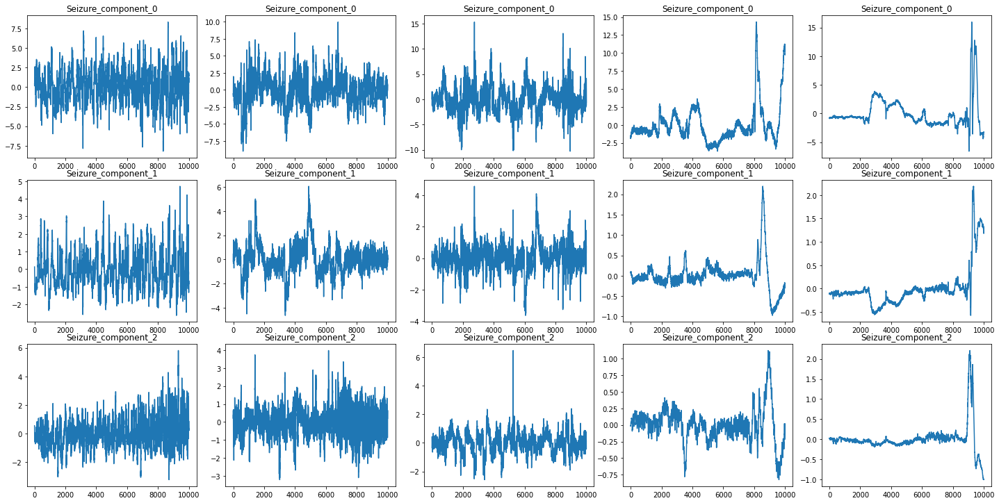

In [14]:
sub_eeg_list = [seizure_q1_pca1, seizure_q1_pca2, seizure_q1_pca3, seizure_q1_pca4, seizure_q1_pca5]
activity_signal_plots(sub_eeg_list, ['Seizure'], components, 10, 20)

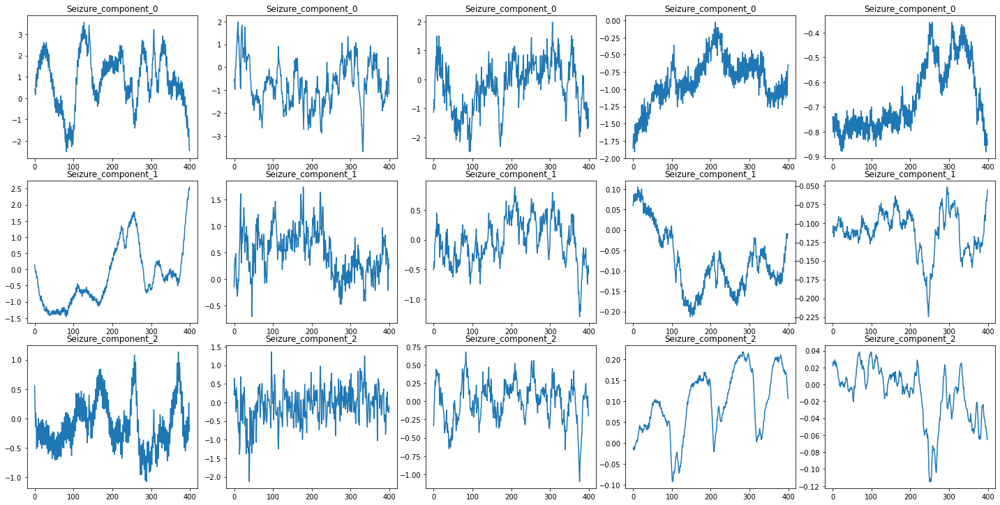

In [15]:
sub_eeg_list = [seizure_q1_pca1[0:400], seizure_q1_pca2[0:400], seizure_q1_pca3[0:400],
                seizure_q1_pca4[0:400], seizure_q1_pca5[0:400]]
activity_signal_plots(sub_eeg_list, ['Seizure'], components, 10, 20)

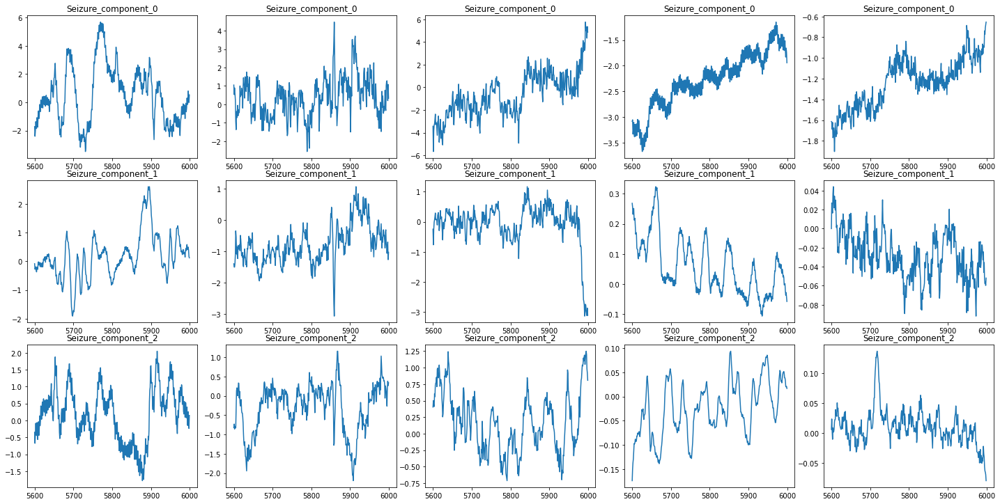

In [16]:
sub_eeg_list = [seizure_q1_pca1[5600:6000], seizure_q1_pca2[5600:6000], seizure_q1_pca3[5600:6000],
                seizure_q1_pca4[5600:6000], seizure_q1_pca5[5600:6000]]
activity_signal_plots(sub_eeg_list, ['Seizure'], components, 10, 20)

##### Seizure Q2

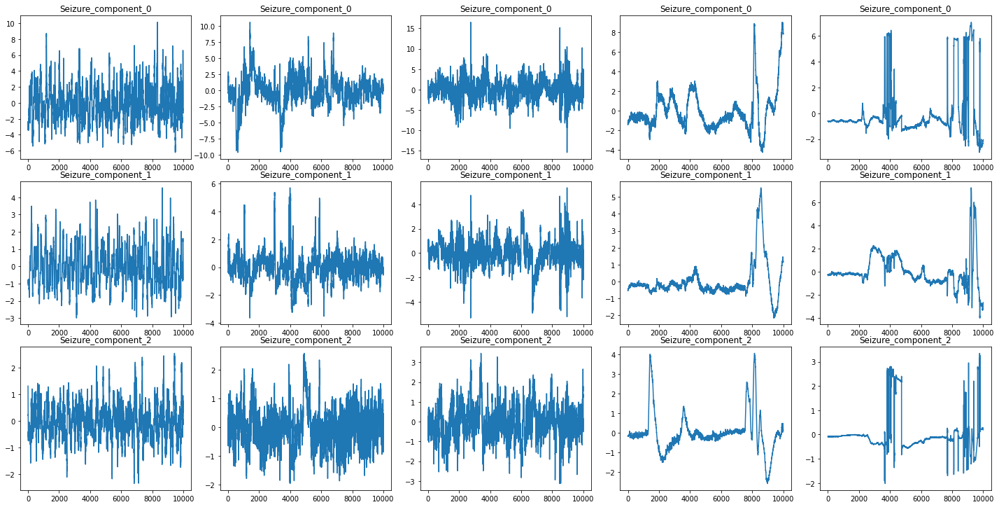

In [17]:
seizure_q2_pca1, seizure_ratio1 = pca_function(scale(seizure_df, seizure_random[0]), group1_q2, 3)
seizure_q2_pca2, seizure_ratio2 = pca_function(scale(seizure_df, seizure_random[1]), group1_q2, 3)
seizure_q2_pca3, seizure_ratio3 = pca_function(scale(seizure_df, seizure_random[2]), group1_q2, 3)
seizure_q2_pca4, seizure_ratio4 = pca_function(scale(seizure_df, seizure_random[3]), group1_q2, 3)
seizure_q2_pca5, seizure_ratio5 = pca_function(scale(seizure_df, seizure_random[4]), group1_q2, 3)

components = seizure_q2_pca1.columns

sub_eeg_list = [seizure_q2_pca1, seizure_q2_pca2, seizure_q2_pca3, seizure_q2_pca4, seizure_q2_pca5]
activity_signal_plots(sub_eeg_list, ['Seizure'], components, 10, 20)

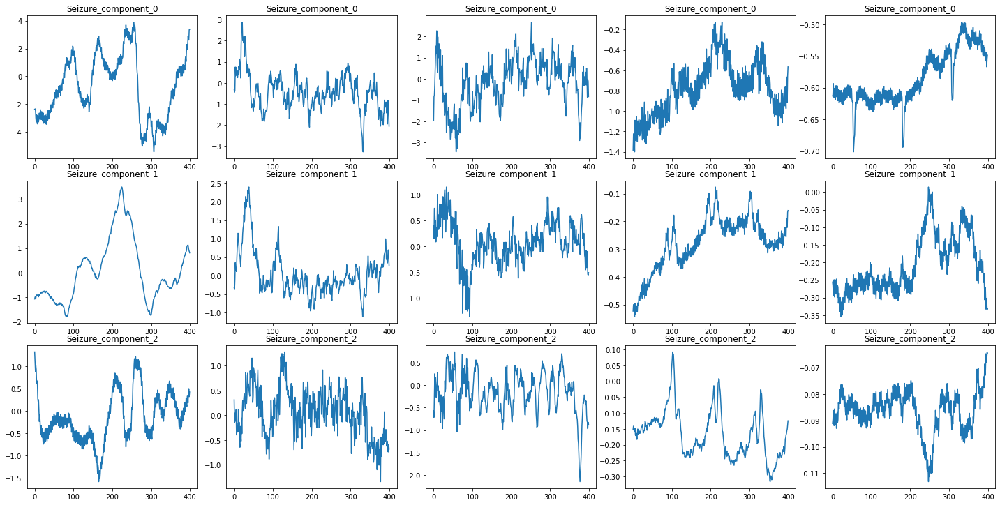

In [18]:
sub_eeg_list = [seizure_q2_pca1[0:400], seizure_q2_pca2[0:400], seizure_q2_pca3[0:400],
                seizure_q2_pca4[0:400], seizure_q2_pca5[0:400]]
activity_signal_plots(sub_eeg_list, ['Seizure'], components, 10, 20)

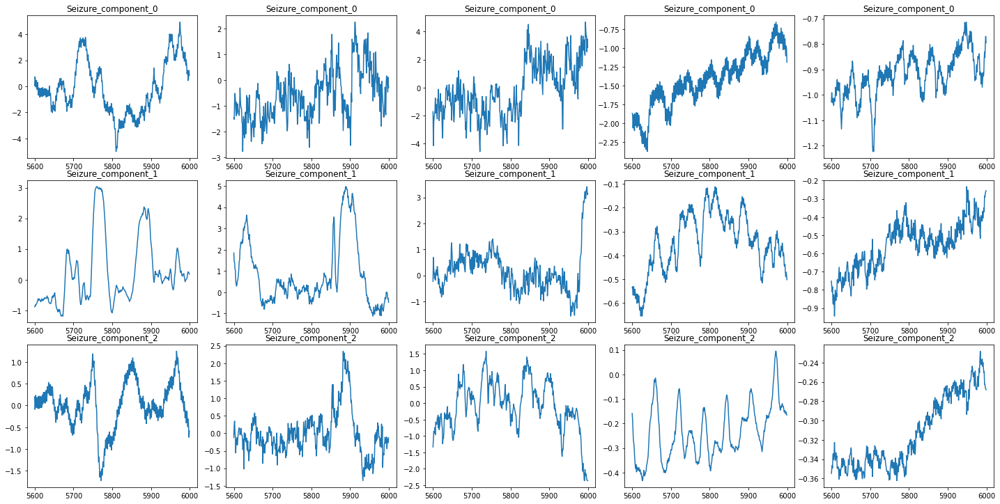

In [19]:
sub_eeg_list = [seizure_q2_pca1[5600:6000], seizure_q2_pca2[5600:6000], seizure_q2_pca3[5600:6000],
                seizure_q2_pca4[5600:6000], seizure_q2_pca5[5600:6000]]
activity_signal_plots(sub_eeg_list, ['Seizure'], components, 10, 20)

##### Seizure Q3

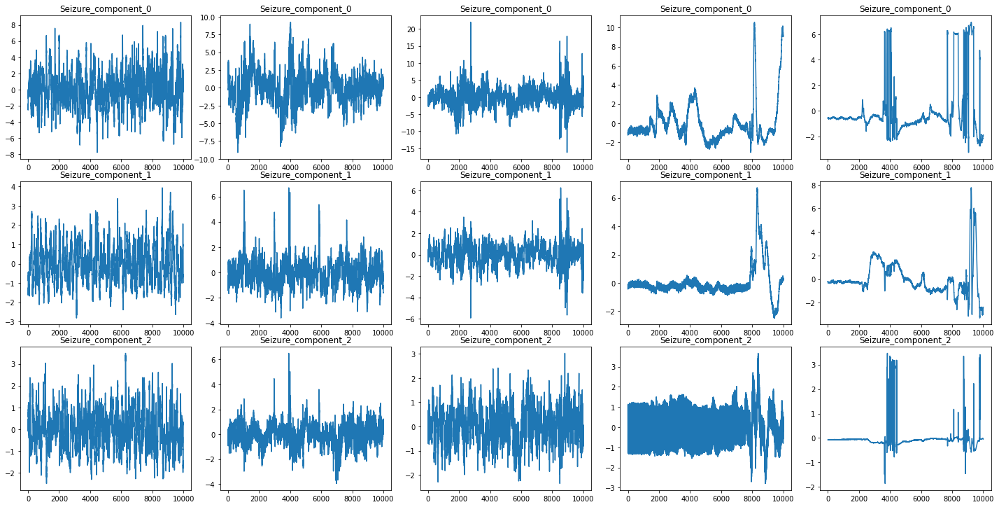

In [20]:
seizure_q3_pca1, seizure_ratio1 = pca_function(scale(seizure_df, seizure_random[0]), group1_q3, 3)
seizure_q3_pca2, seizure_ratio2 = pca_function(scale(seizure_df, seizure_random[1]), group1_q3, 3)
seizure_q3_pca3, seizure_ratio3 = pca_function(scale(seizure_df, seizure_random[2]), group1_q3, 3)
seizure_q3_pca4, seizure_ratio4 = pca_function(scale(seizure_df, seizure_random[3]), group1_q3, 3)
seizure_q3_pca5, seizure_ratio5 = pca_function(scale(seizure_df, seizure_random[4]), group1_q3, 3)

components = seizure_q3_pca1.columns

sub_eeg_list = [seizure_q3_pca1, seizure_q3_pca2, seizure_q3_pca3, seizure_q3_pca4, seizure_q3_pca5]
activity_signal_plots(sub_eeg_list, ['Seizure'], components, 10, 20)

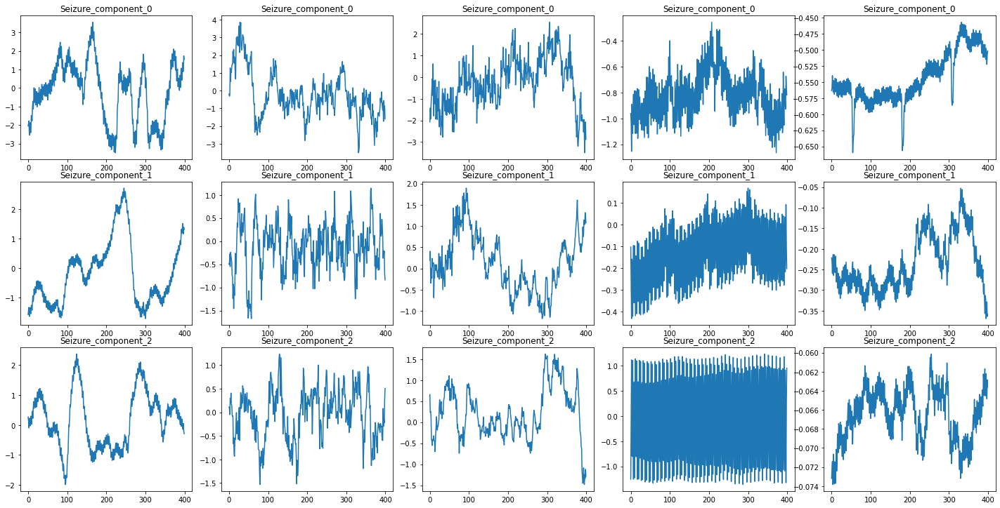

In [21]:
sub_eeg_list = [seizure_q3_pca1[0:400], seizure_q3_pca2[0:400], seizure_q3_pca3[0:400],
                seizure_q3_pca4[0:400], seizure_q3_pca5[0:400]]
activity_signal_plots(sub_eeg_list, ['Seizure'], components, 10, 20)

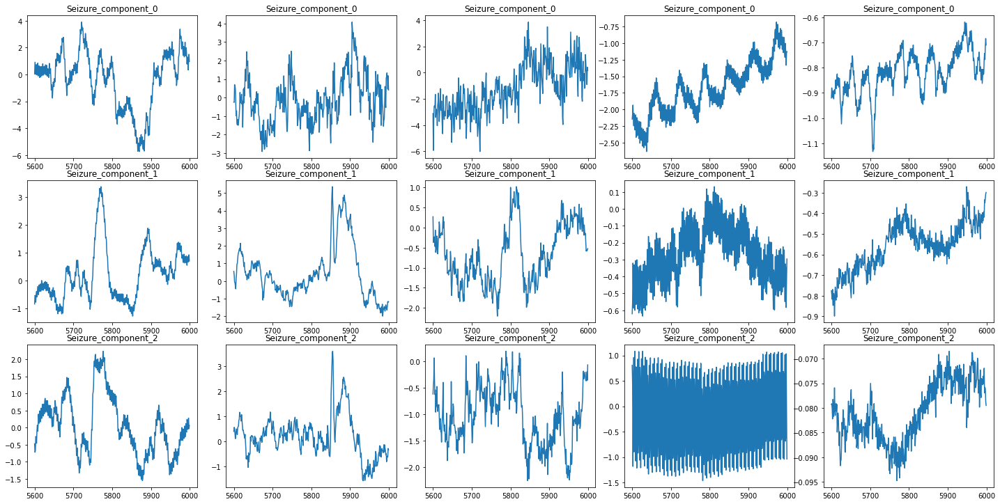

In [22]:
sub_eeg_list = [seizure_q3_pca1[5600:6000], seizure_q3_pca2[5600:6000], seizure_q3_pca3[5600:6000],
                seizure_q3_pca4[5600:6000], seizure_q3_pca5[5600:6000]]
activity_signal_plots(sub_eeg_list, ['Seizure'], components, 10, 20)

##### Seizure Q4

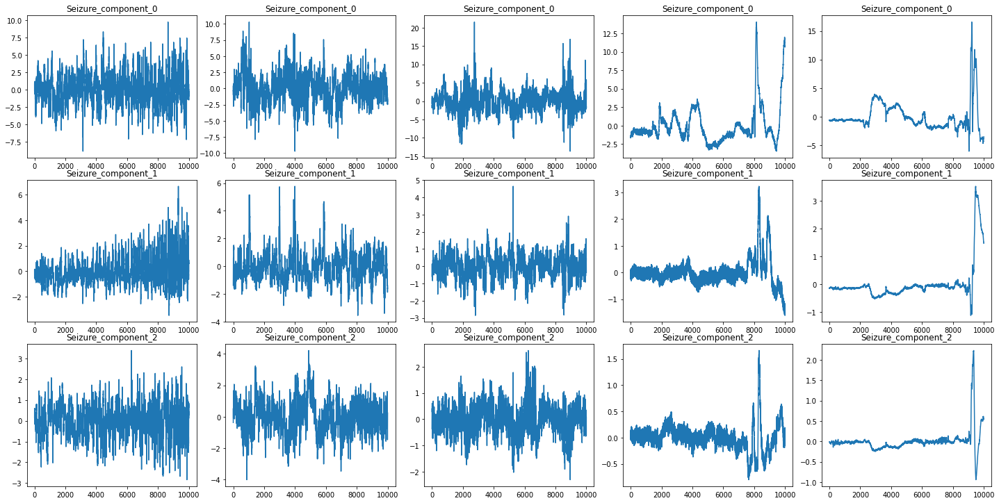

In [23]:
seizure_q4_pca1, seizure_ratio1 = pca_function(scale(seizure_df, seizure_random[0]), group1_q4, 3)
seizure_q4_pca2, seizure_ratio2 = pca_function(scale(seizure_df, seizure_random[1]), group1_q4, 3)
seizure_q4_pca3, seizure_ratio3 = pca_function(scale(seizure_df, seizure_random[2]), group1_q4, 3)
seizure_q4_pca4, seizure_ratio4 = pca_function(scale(seizure_df, seizure_random[3]), group1_q4, 3)
seizure_q4_pca5, seizure_ratio5 = pca_function(scale(seizure_df, seizure_random[4]), group1_q4, 3)

components = seizure_q4_pca1.columns

sub_eeg_list = [seizure_q4_pca1, seizure_q4_pca2, seizure_q4_pca3, seizure_q4_pca4, seizure_q4_pca5]
activity_signal_plots(sub_eeg_list, ['Seizure'], components, 10, 20)

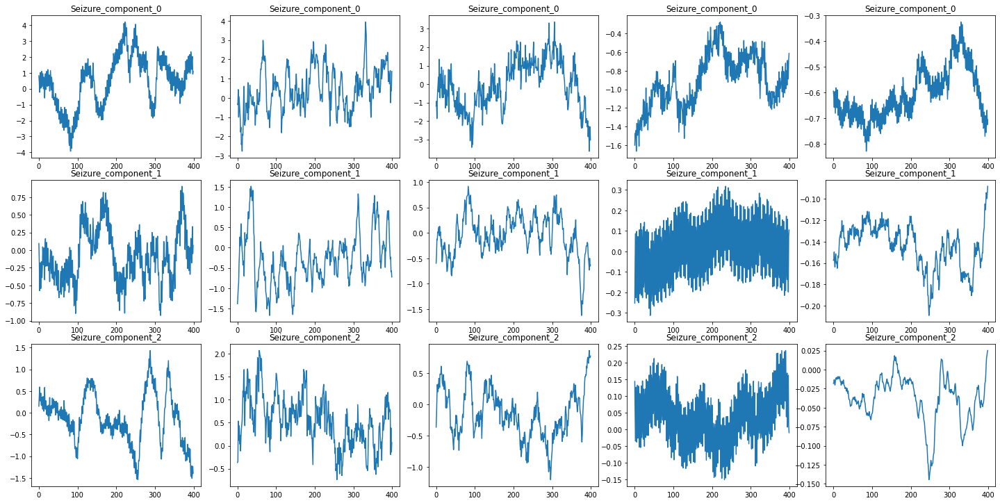

In [24]:
sub_eeg_list = [seizure_q4_pca1[0:400], seizure_q4_pca2[0:400], seizure_q4_pca3[0:400],
                seizure_q4_pca4[0:400], seizure_q4_pca5[0:400]]
activity_signal_plots(sub_eeg_list, ['Seizure'], components, 10, 20)

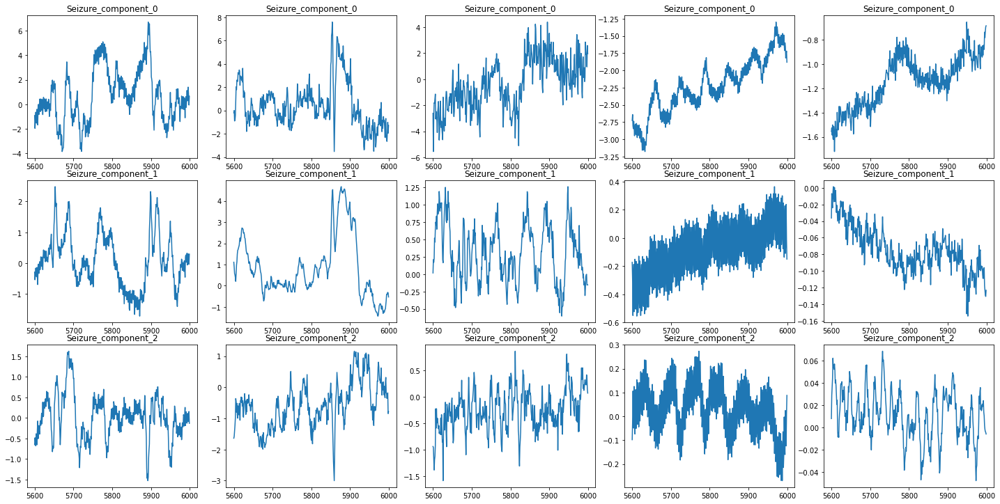

In [25]:
sub_eeg_list = [seizure_q4_pca1[5600:6000], seizure_q4_pca2[5600:6000], seizure_q4_pca3[5600:6000],
                seizure_q4_pca4[5600:6000], seizure_q4_pca5[5600:6000]]
activity_signal_plots(sub_eeg_list, ['Seizure'], components, 10, 20)

##### LPD Q1

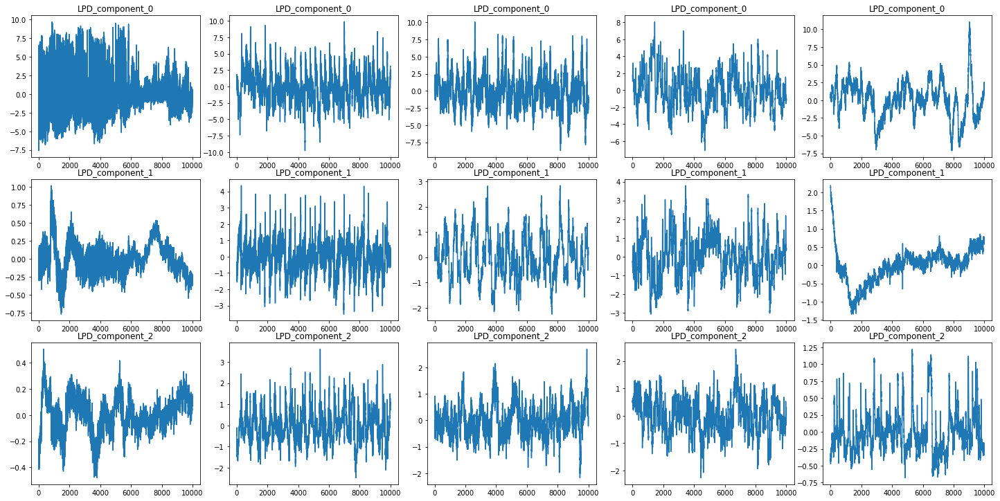

In [26]:
lpd_indexes = [i for i in range(lpd_df.shape[0])]
lpd_random = np.random.choice(lpd_indexes, size = 5, replace = False)
lpd_pca1, lpd_ratio1 = pca_function(scale(lpd_df, lpd_random[0]), group1_q1, 3)
lpd_pca2, lpd_ratio2 = pca_function(scale(lpd_df, lpd_random[1]), group1_q1, 3)
lpd_pca3, lpd_ratio3 = pca_function(scale(lpd_df, lpd_random[2]), group1_q1, 3)
lpd_pca4, lpd_ratio4 = pca_function(scale(lpd_df, lpd_random[3]), group1_q1, 3)
lpd_pca5, lpd_ratio5 = pca_function(scale(lpd_df, lpd_random[4]), group1_q1, 3)
components = lpd_pca1.columns
sub_eeg_list = [lpd_pca1, lpd_pca2, lpd_pca3, lpd_pca4, lpd_pca5]
activity_signal_plots(sub_eeg_list, ['LPD'], components, 10, 20)

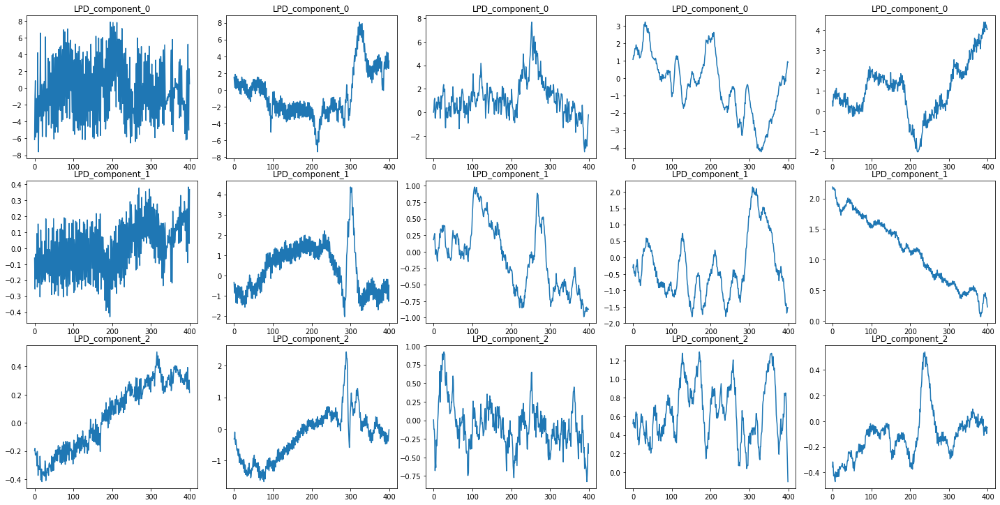

In [27]:
sub_eeg_list = [lpd_pca1[0:400], lpd_pca2[0:400], lpd_pca3[0:400],
                lpd_pca4[0:400], lpd_pca5[0:400]]
activity_signal_plots(sub_eeg_list, ['LPD'], components, 10, 20)

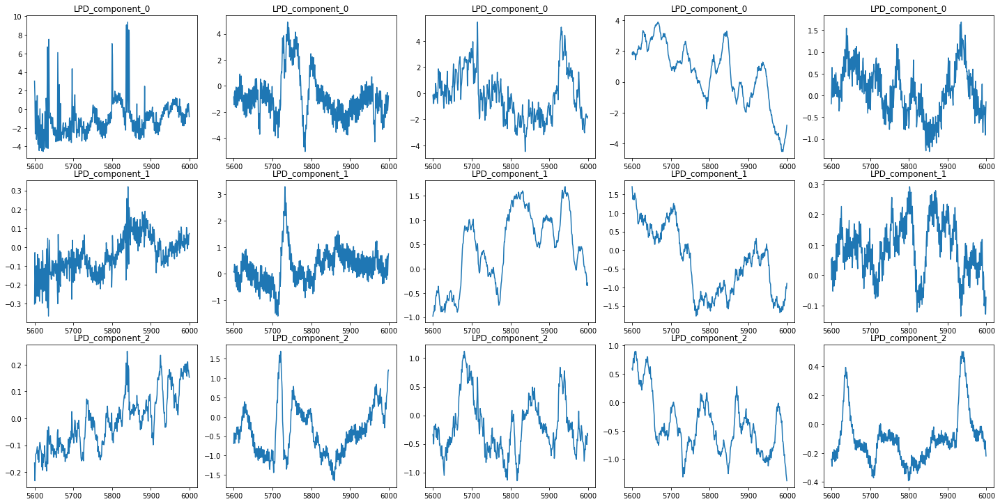

In [28]:
sub_eeg_list = [lpd_pca1[5600:6000], lpd_pca2[5600:6000], lpd_pca3[5600:6000],
                lpd_pca4[5600:6000], lpd_pca5[5600:6000]]
activity_signal_plots(sub_eeg_list, ['LPD'], components, 10, 20)

##### LPD Q2

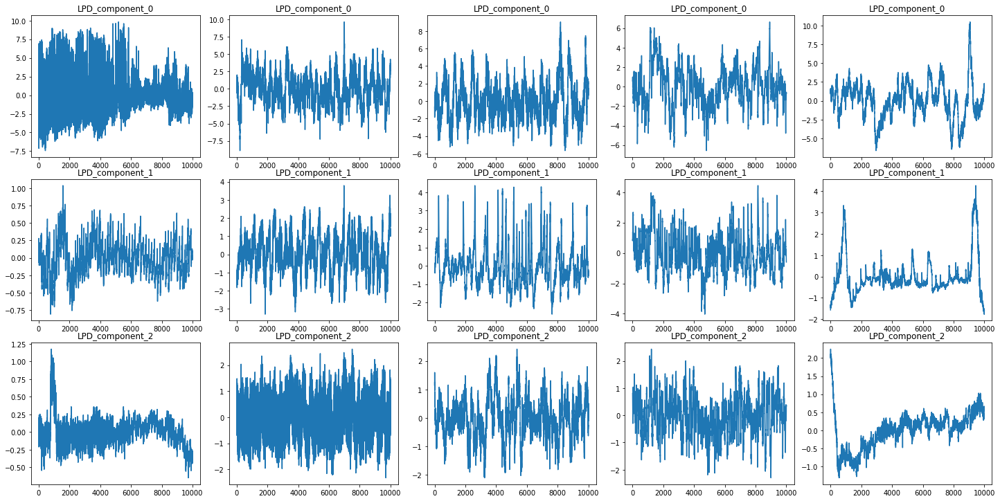

In [29]:
lpd_q2_pca1, lpd_ratio1 = pca_function(scale(lpd_df, lpd_random[0]), group1_q2, 3)
lpd_q2_pca2, lpd_ratio2 = pca_function(scale(lpd_df, lpd_random[1]), group1_q2, 3)
lpd_q2_pca3, lpd_ratio3 = pca_function(scale(lpd_df, lpd_random[2]), group1_q2, 3)
lpd_q2_pca4, lpd_ratio4 = pca_function(scale(lpd_df, lpd_random[3]), group1_q2, 3)
lpd_q2_pca5, lpd_ratio5 = pca_function(scale(lpd_df, lpd_random[4]), group1_q2, 3)

components = lpd_q2_pca1.columns

sub_eeg_list = [lpd_q2_pca1, lpd_q2_pca2, lpd_q2_pca3, lpd_q2_pca4, lpd_q2_pca5]
activity_signal_plots(sub_eeg_list, ['LPD'], components, 10, 20)

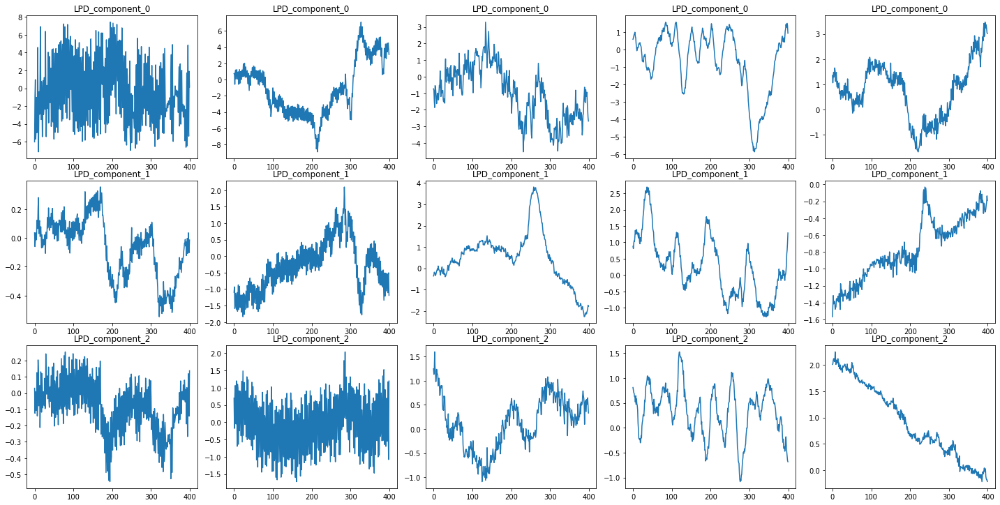

In [30]:
sub_eeg_list = [lpd_q2_pca1[0:400], lpd_q2_pca2[0:400], lpd_q2_pca3[0:400],
                lpd_q2_pca4[0:400], lpd_q2_pca5[0:400]]
activity_signal_plots(sub_eeg_list, ['LPD'], components, 10, 20)

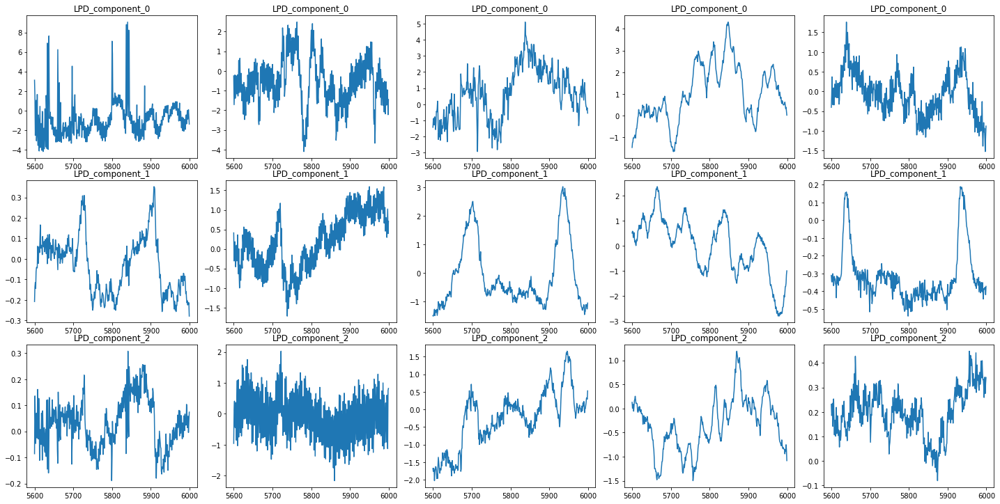

In [31]:
sub_eeg_list = [lpd_q2_pca1[5600:6000], lpd_q2_pca2[5600:6000], lpd_q2_pca3[5600:6000],
                lpd_q2_pca4[5600:6000], lpd_q2_pca5[5600:6000]]
activity_signal_plots(sub_eeg_list, ['LPD'], components, 10, 20)

##### LPD Q3

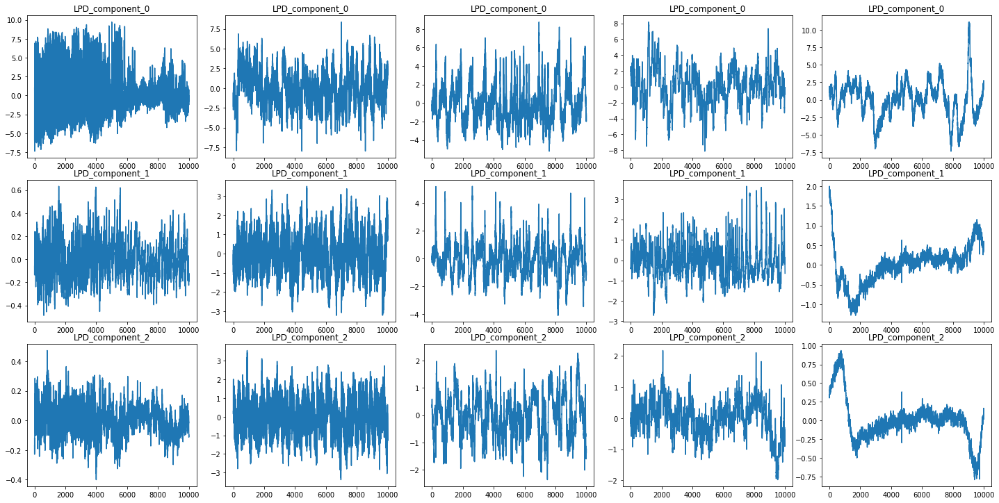

In [32]:
lpd_q3_pca1, lpd_ratio1 = pca_function(scale(lpd_df, lpd_random[0]), group1_q3, 3)
lpd_q3_pca2, lpd_ratio2 = pca_function(scale(lpd_df, lpd_random[1]), group1_q3, 3)
lpd_q3_pca3, lpd_ratio3 = pca_function(scale(lpd_df, lpd_random[2]), group1_q3, 3)
lpd_q3_pca4, lpd_ratio4 = pca_function(scale(lpd_df, lpd_random[3]), group1_q3, 3)
lpd_q3_pca5, lpd_ratio5 = pca_function(scale(lpd_df, lpd_random[4]), group1_q3, 3)

components = lpd_q3_pca1.columns

sub_eeg_list = [lpd_q3_pca1, lpd_q3_pca2, lpd_q3_pca3, lpd_q3_pca4, lpd_q3_pca5]
activity_signal_plots(sub_eeg_list, ['LPD'], components, 10, 20)

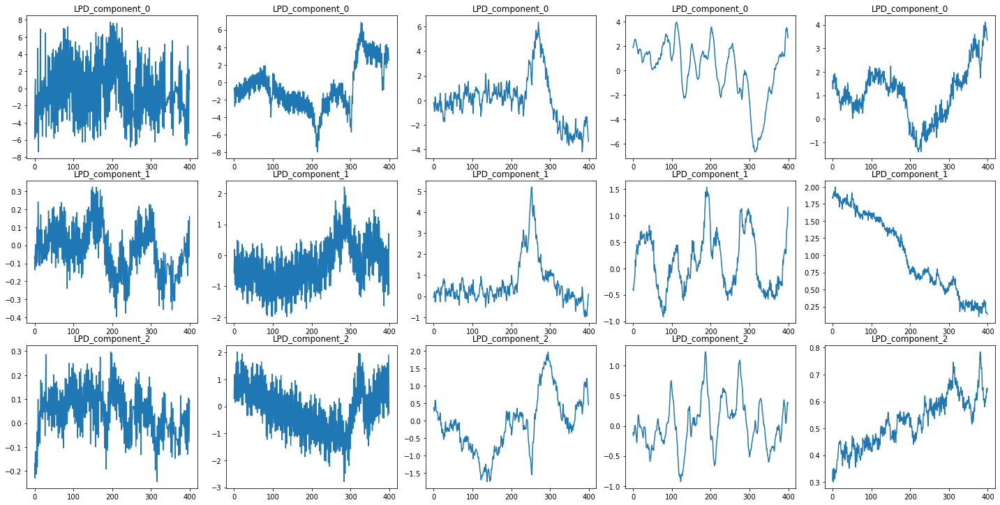

In [33]:
sub_eeg_list = [lpd_q3_pca1[0:400], lpd_q3_pca2[0:400], lpd_q3_pca3[0:400],
                lpd_q3_pca4[0:400], lpd_q3_pca5[0:400]]
activity_signal_plots(sub_eeg_list, ['LPD'], components, 10, 20)

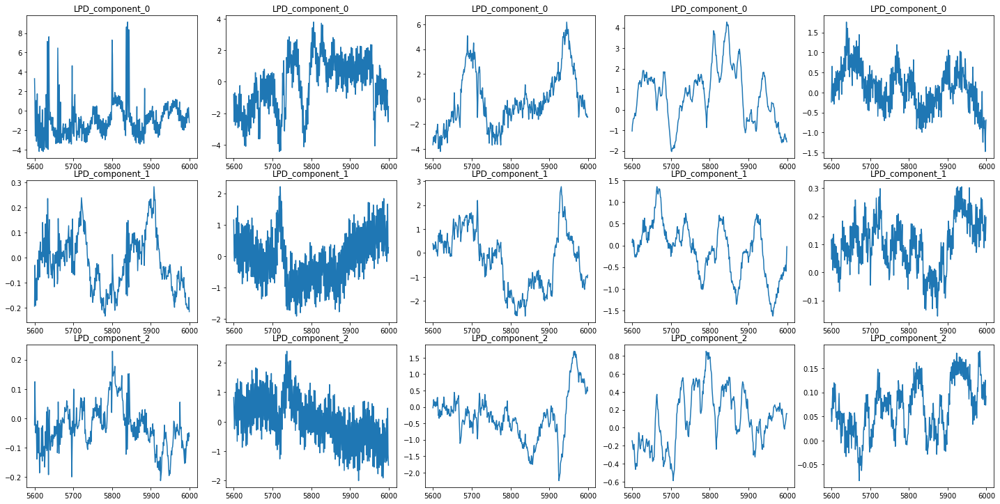

In [34]:
sub_eeg_list = [lpd_q3_pca1[5600:6000], lpd_q3_pca2[5600:6000], lpd_q3_pca3[5600:6000],
                lpd_q3_pca4[5600:6000], lpd_q3_pca5[5600:6000]]
activity_signal_plots(sub_eeg_list, ['LPD'], components, 10, 20)

##### LPD Q4

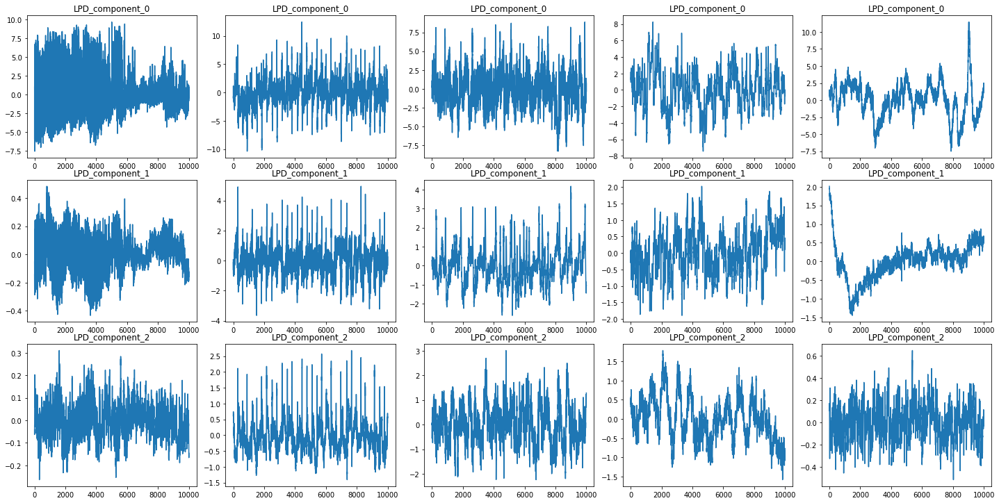

In [35]:
lpd_q4_pca1, lpd_ratio1 = pca_function(scale(lpd_df, lpd_random[0]), group1_q4, 3)
lpd_q4_pca2, lpd_ratio2 = pca_function(scale(lpd_df, lpd_random[1]), group1_q4, 3)
lpd_q4_pca3, lpd_ratio3 = pca_function(scale(lpd_df, lpd_random[2]), group1_q4, 3)
lpd_q4_pca4, lpd_ratio4 = pca_function(scale(lpd_df, lpd_random[3]), group1_q4, 3)
lpd_q4_pca5, lpd_ratio5 = pca_function(scale(lpd_df, lpd_random[4]), group1_q4, 3)

components = lpd_q4_pca1.columns

sub_eeg_list = [lpd_q4_pca1, lpd_q4_pca2, lpd_q4_pca3, lpd_q4_pca4, lpd_q4_pca5]
activity_signal_plots(sub_eeg_list, ['LPD'], components, 10, 20)

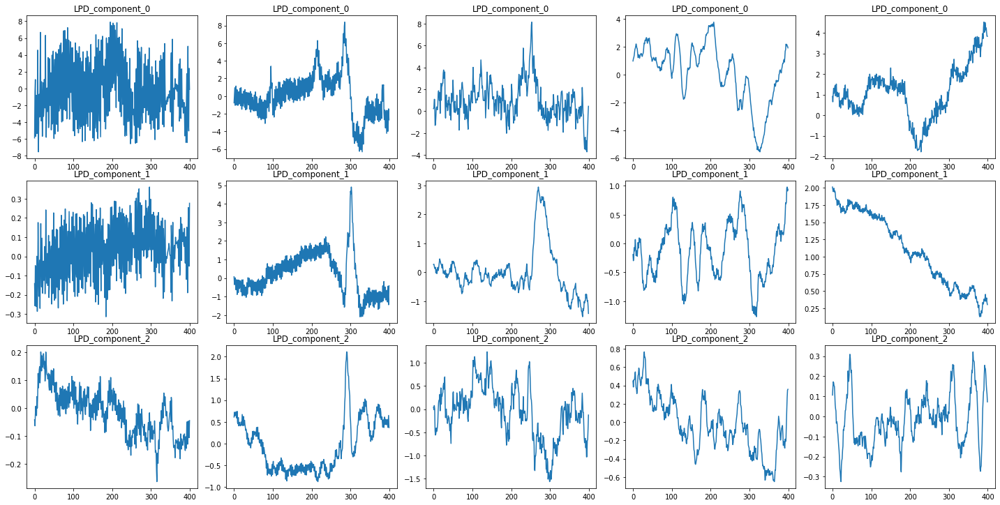

In [36]:
sub_eeg_list = [lpd_q4_pca1[0:400], lpd_q4_pca2[0:400], lpd_q4_pca3[0:400],
                lpd_q4_pca4[0:400], lpd_q4_pca5[0:400]]
activity_signal_plots(sub_eeg_list, ['LPD'], components, 10, 20)

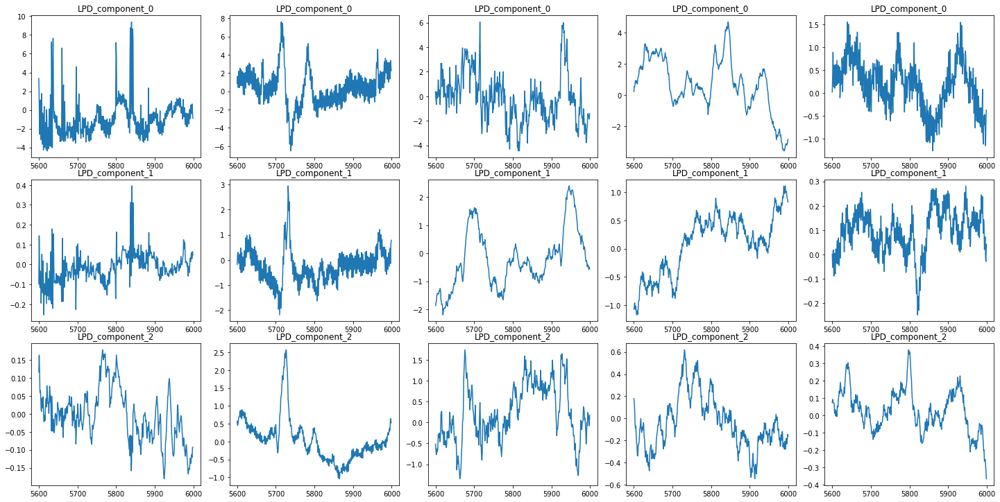

In [37]:
sub_eeg_list = [lpd_q4_pca1[5600:6000], lpd_q4_pca2[5600:6000], lpd_q4_pca3[5600:6000],
                lpd_q4_pca4[5600:6000], lpd_q4_pca5[5600:6000]]
activity_signal_plots(sub_eeg_list, ['LPD'], components, 10, 20)

##### GPD Q1

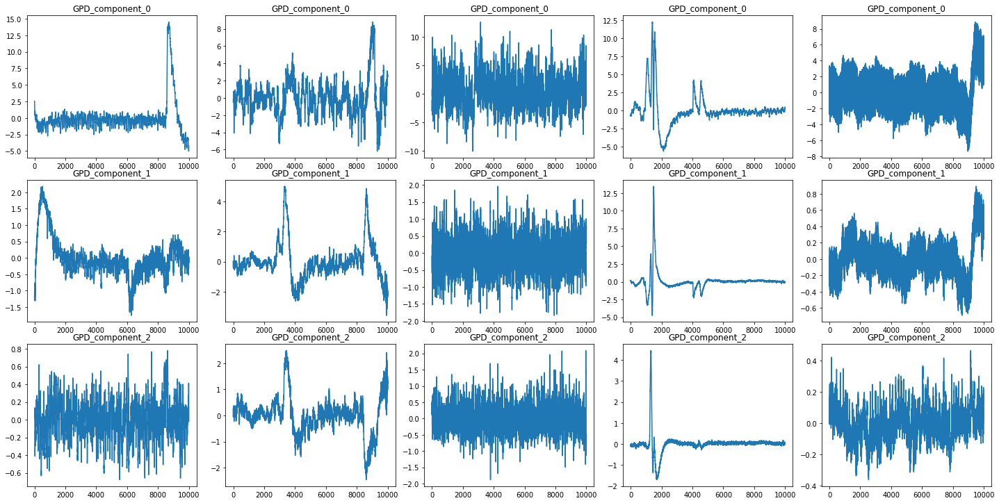

In [38]:
gpd_indexes = [i for i in range(gpd_df.shape[0])]
gpd_random = np.random.choice(gpd_indexes, size = 5, replace = False)
gpd_pca1, gpd_ratio1 = pca_function(scale(gpd_df, gpd_random[0]), group1_q1, 3)
gpd_pca2, gpd_ratio2 = pca_function(scale(gpd_df, gpd_random[1]), group1_q1, 3)
gpd_pca3, gpd_ratio3 = pca_function(scale(gpd_df, gpd_random[2]), group1_q1, 3)
gpd_pca4, gpd_ratio4 = pca_function(scale(gpd_df, gpd_random[3]), group1_q1, 3)
gpd_pca5, gpd_ratio5 = pca_function(scale(gpd_df, gpd_random[4]), group1_q1, 3)
components = gpd_pca1.columns
sub_eeg_list = [gpd_pca1, gpd_pca2, gpd_pca3, gpd_pca4, gpd_pca5]
activity_signal_plots(sub_eeg_list, ['GPD'], components, 10, 20)

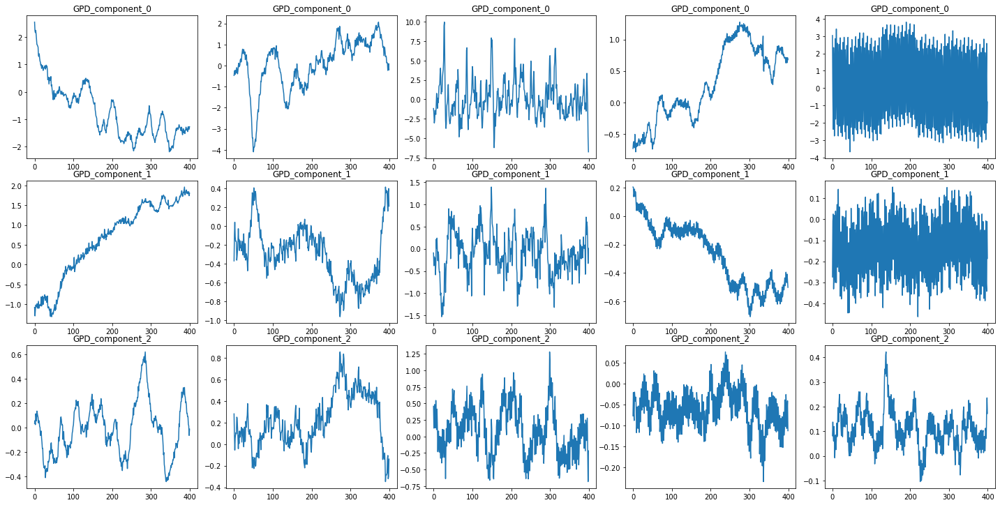

In [39]:
sub_eeg_list = [gpd_pca1[0:400], gpd_pca2[0:400], gpd_pca3[0:400],
                gpd_pca4[0:400], gpd_pca5[0:400]]
activity_signal_plots(sub_eeg_list, ['GPD'], components, 10, 20)

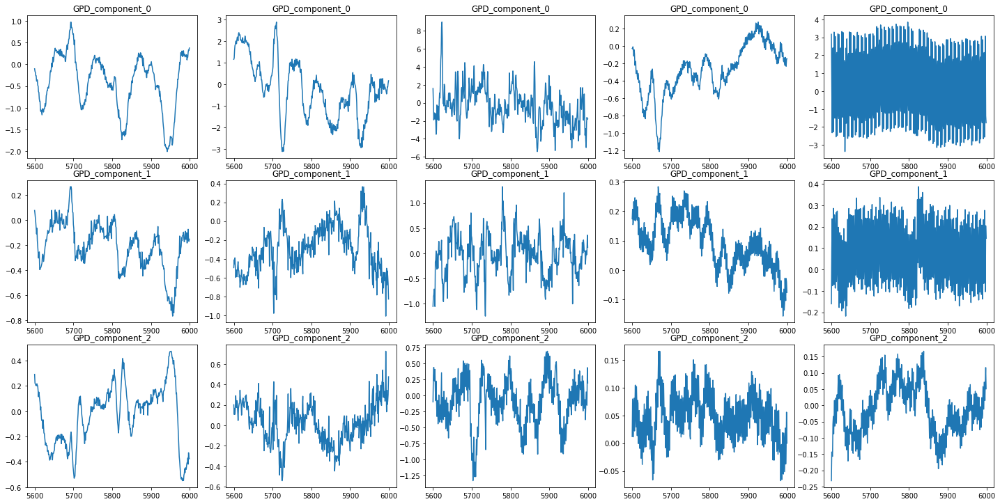

In [40]:
sub_eeg_list = [gpd_pca1[5600:6000], gpd_pca2[5600:6000], gpd_pca3[5600:6000],
                gpd_pca4[5600:6000], gpd_pca5[5600:6000]]
activity_signal_plots(sub_eeg_list, ['GPD'], components, 10, 20)

##### GPD Q2

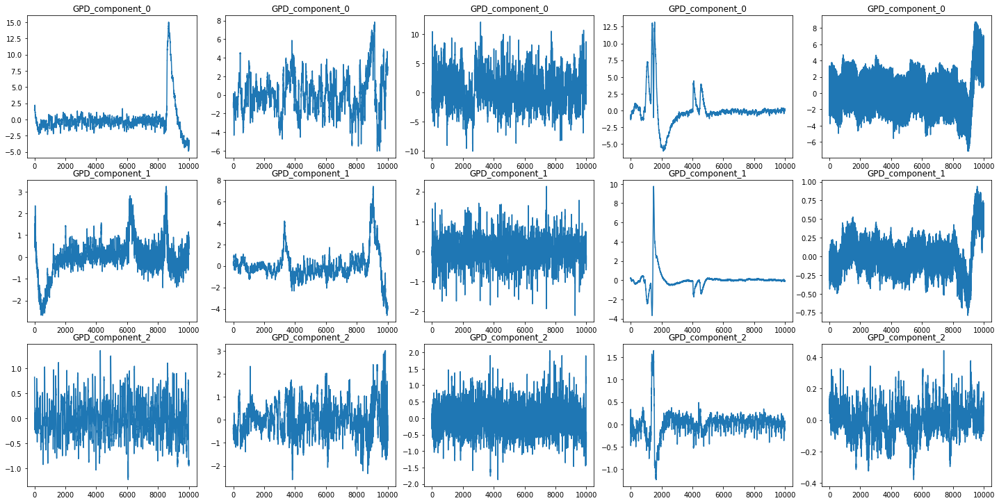

In [41]:
gpd_q2_pca1, gpd_ratio1 = pca_function(scale(gpd_df, gpd_random[0]), group1_q2, 3)
gpd_q2_pca2, gpd_ratio2 = pca_function(scale(gpd_df, gpd_random[1]), group1_q2, 3)
gpd_q2_pca3, gpd_ratio3 = pca_function(scale(gpd_df, gpd_random[2]), group1_q2, 3)
gpd_q2_pca4, gpd_ratio4 = pca_function(scale(gpd_df, gpd_random[3]), group1_q2, 3)
gpd_q2_pca5, gpd_ratio5 = pca_function(scale(gpd_df, gpd_random[4]), group1_q2, 3)

components = gpd_q2_pca1.columns

sub_eeg_list = [gpd_q2_pca1, gpd_q2_pca2, gpd_q2_pca3, gpd_q2_pca4, gpd_q2_pca5]
activity_signal_plots(sub_eeg_list, ['GPD'], components, 10, 20)

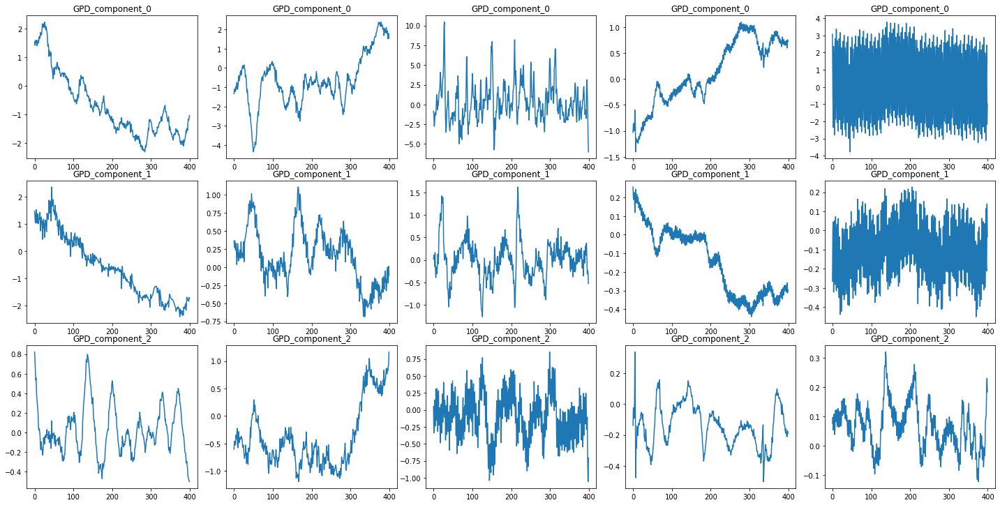

In [42]:
sub_eeg_list = [gpd_q2_pca1[0:400], gpd_q2_pca2[0:400], gpd_q2_pca3[0:400],
                gpd_q2_pca4[0:400], gpd_q2_pca5[0:400]]
activity_signal_plots(sub_eeg_list, ['GPD'], components, 10, 20)

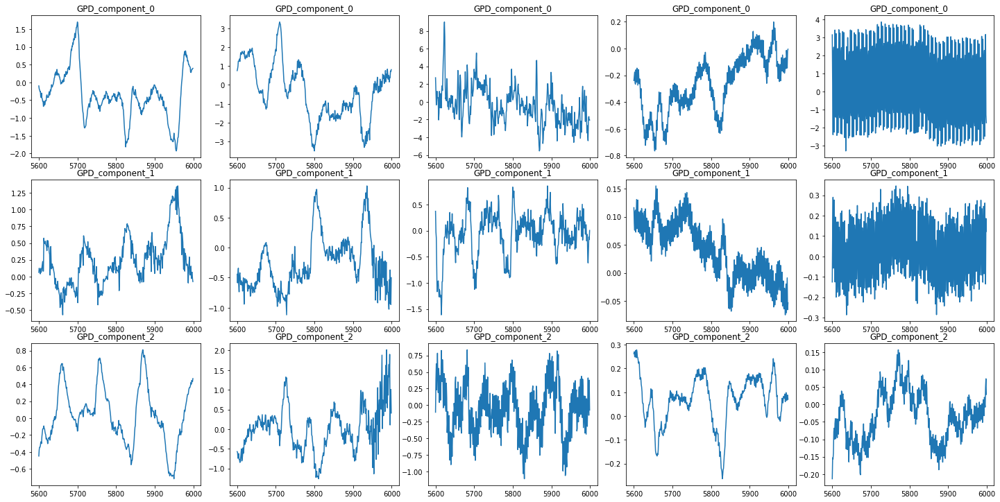

In [43]:
sub_eeg_list = [gpd_q2_pca1[5600:6000], gpd_q2_pca2[5600:6000], gpd_q2_pca3[5600:6000],
                gpd_q2_pca4[5600:6000], gpd_q2_pca5[5600:6000]]
activity_signal_plots(sub_eeg_list, ['GPD'], components, 10, 20)

##### GPD Q3

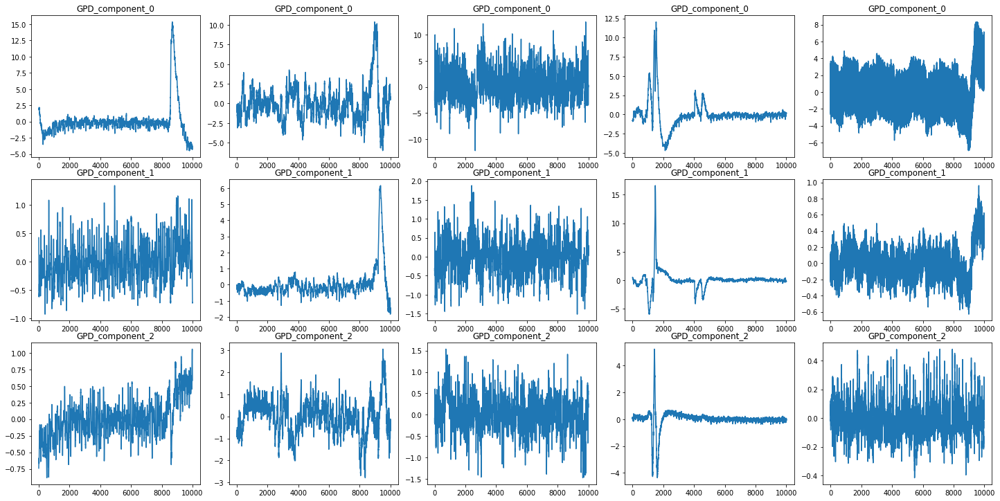

In [44]:
gpd_q3_pca1, gpd_ratio1 = pca_function(scale(gpd_df, gpd_random[0]), group1_q3, 3)
gpd_q3_pca2, gpd_ratio2 = pca_function(scale(gpd_df, gpd_random[1]), group1_q3, 3)
gpd_q3_pca3, gpd_ratio3 = pca_function(scale(gpd_df, gpd_random[2]), group1_q3, 3)
gpd_q3_pca4, gpd_ratio4 = pca_function(scale(gpd_df, gpd_random[3]), group1_q3, 3)
gpd_q3_pca5, gpd_ratio5 = pca_function(scale(gpd_df, gpd_random[4]), group1_q3, 3)

components = gpd_q3_pca1.columns

sub_eeg_list = [gpd_q3_pca1, gpd_q3_pca2, gpd_q3_pca3, gpd_q3_pca4, gpd_q3_pca5]
activity_signal_plots(sub_eeg_list, ['GPD'], components, 10, 20)

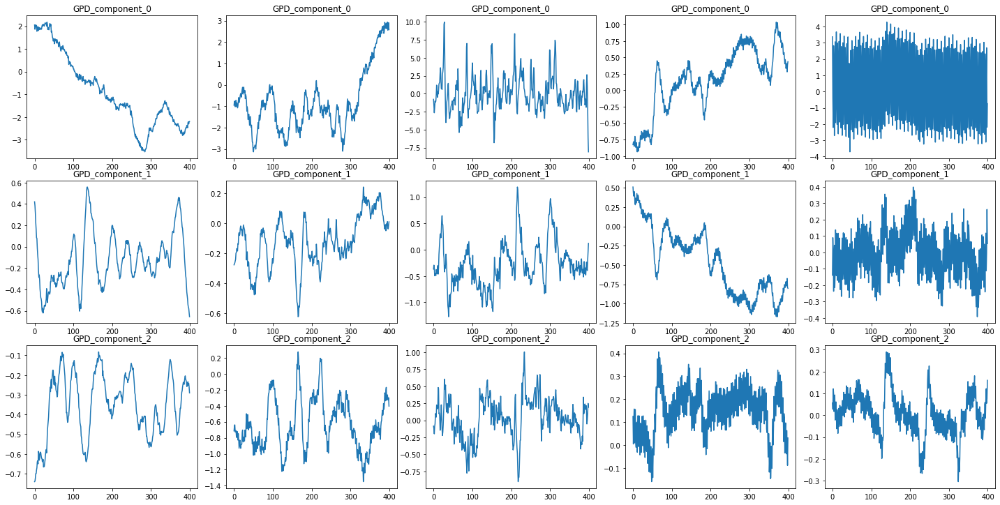

In [45]:
sub_eeg_list = [gpd_q3_pca1[0:400], gpd_q3_pca2[0:400], gpd_q3_pca3[0:400],
                gpd_q3_pca4[0:400], gpd_q3_pca5[0:400]]
activity_signal_plots(sub_eeg_list, ['GPD'], components, 10, 20)

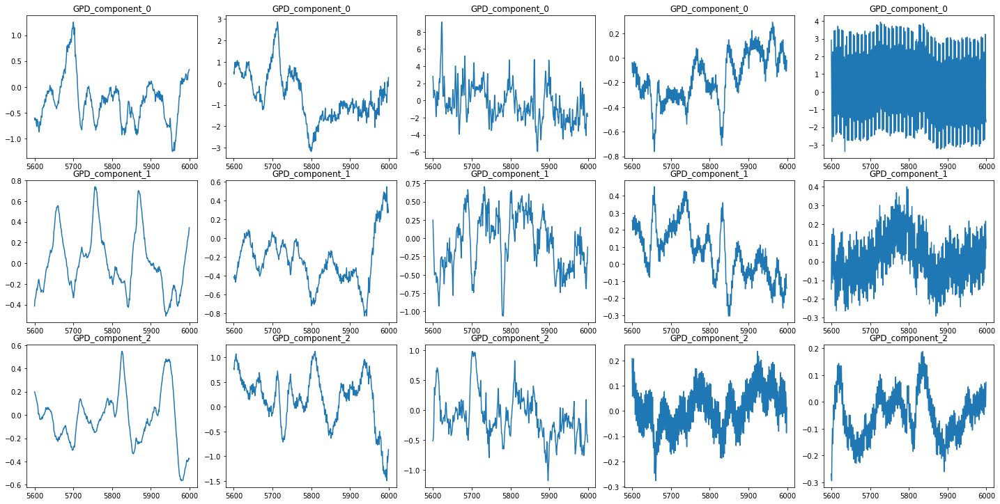

In [46]:
sub_eeg_list = [gpd_q3_pca1[5600:6000], gpd_q3_pca2[5600:6000], gpd_q3_pca3[5600:6000],
                gpd_q3_pca4[5600:6000], gpd_q3_pca5[5600:6000]]
activity_signal_plots(sub_eeg_list, ['GPD'], components, 10, 20)

##### GPD Q4

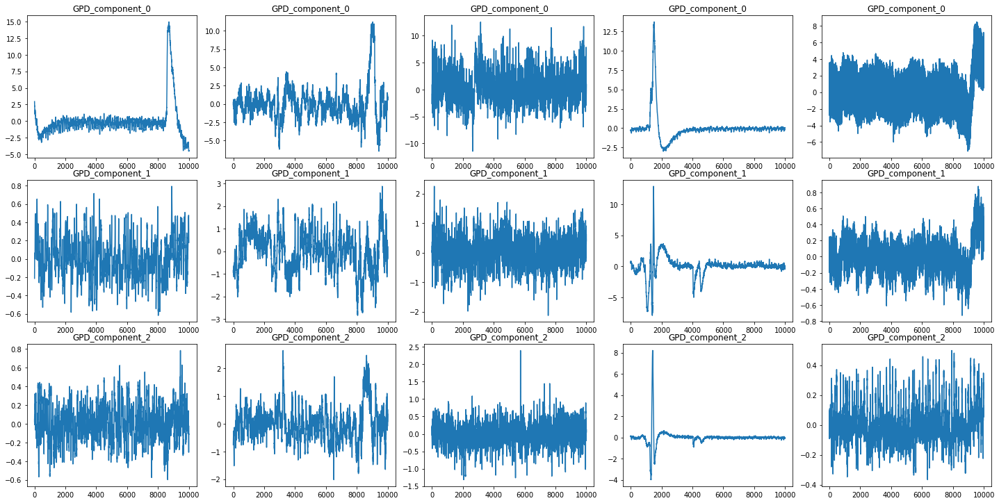

In [47]:
gpd_q4_pca1, gpd_ratio1 = pca_function(scale(gpd_df, gpd_random[0]), group1_q4, 3)
gpd_q4_pca2, gpd_ratio2 = pca_function(scale(gpd_df, gpd_random[1]), group1_q4, 3)
gpd_q4_pca3, gpd_ratio3 = pca_function(scale(gpd_df, gpd_random[2]), group1_q4, 3)
gpd_q4_pca4, gpd_ratio4 = pca_function(scale(gpd_df, gpd_random[3]), group1_q4, 3)
gpd_q4_pca5, gpd_ratio5 = pca_function(scale(gpd_df, gpd_random[4]), group1_q4, 3)

components = gpd_q4_pca1.columns

sub_eeg_list = [gpd_q4_pca1, gpd_q4_pca2, gpd_q4_pca3, gpd_q4_pca4, gpd_q4_pca5]
activity_signal_plots(sub_eeg_list, ['GPD'], components, 10, 20)

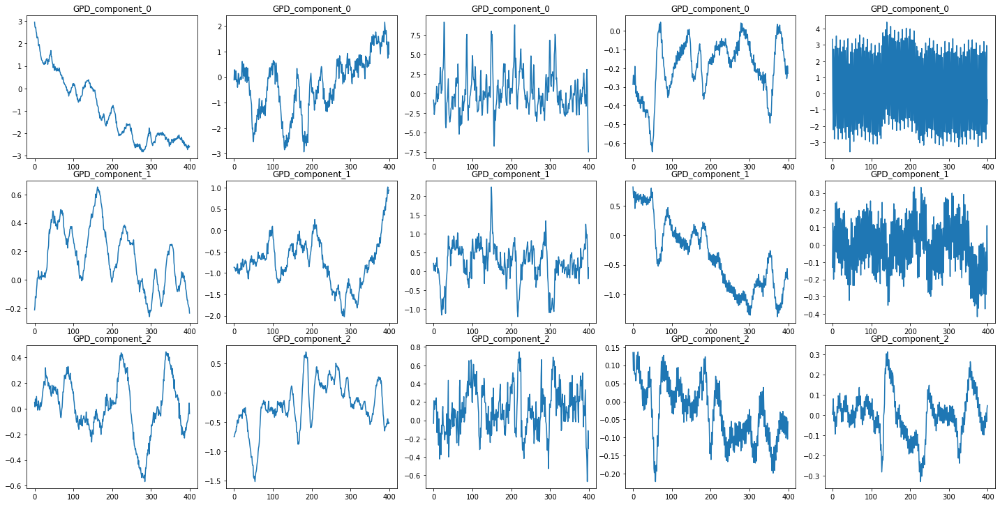

In [48]:
sub_eeg_list = [gpd_q4_pca1[0:400], gpd_q4_pca2[0:400], gpd_q4_pca3[0:400],
                gpd_q4_pca4[0:400], gpd_q4_pca5[0:400]]
activity_signal_plots(sub_eeg_list, ['GPD'], components, 10, 20)

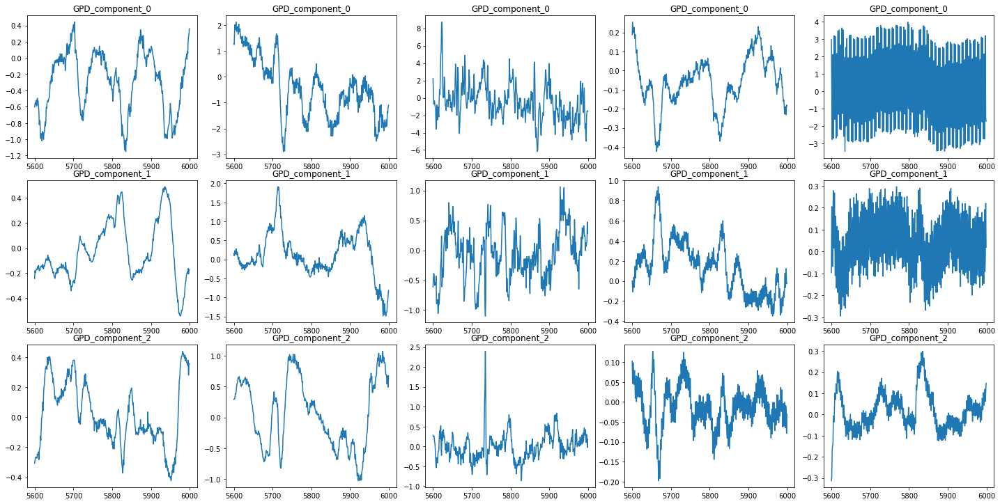

In [49]:
sub_eeg_list = [gpd_q4_pca1[5600:6000], gpd_q4_pca2[5600:6000], gpd_q4_pca3[5600:6000],
                gpd_q4_pca4[5600:6000], gpd_q4_pca5[5600:6000]]
activity_signal_plots(sub_eeg_list, ['GPD'], components, 10, 20)

##### LRDA Q1

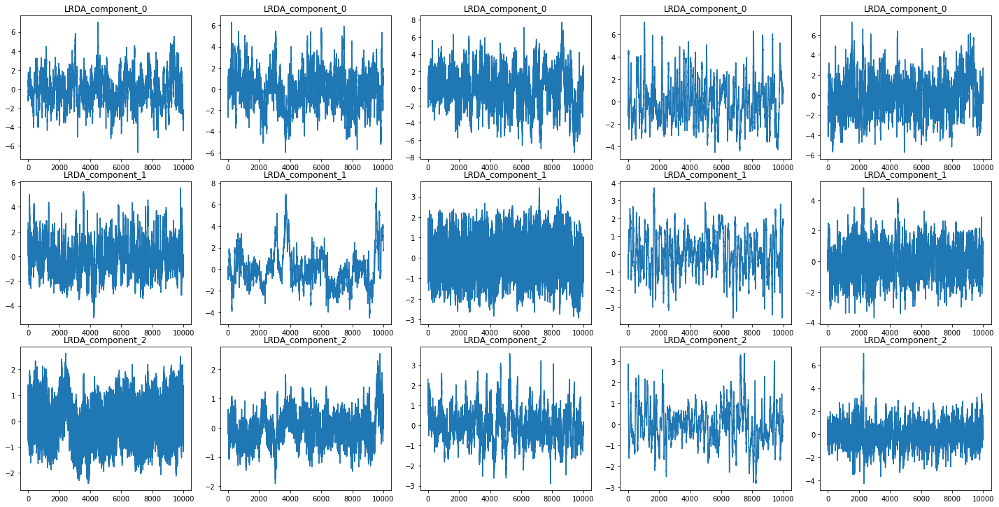

In [50]:
lrda_indexes = [i for i in range(lrda_df.shape[0])]
lrda_random = np.random.choice(lrda_indexes, size = 5, replace = False)
lrda_q1_pca1, lrda_ratio1 = pca_function(scale(lrda_df, lrda_random[0]), group1_q1, 3)
lrda_q1_pca2, lrda_ratio2 = pca_function(scale(lrda_df, lrda_random[1]), group1_q1, 3)
lrda_q1_pca3, lrda_ratio3 = pca_function(scale(lrda_df, lrda_random[2]), group1_q1, 3)
lrda_q1_pca4, lrda_ratio4 = pca_function(scale(lrda_df, lrda_random[3]), group1_q1, 3)
lrda_q1_pca5, lrda_ratio5 = pca_function(scale(lrda_df, lrda_random[4]), group1_q1, 3)
components = lrda_q1_pca1.columns
sub_eeg_list = [lrda_q1_pca1, lrda_q1_pca2, lrda_q1_pca3, lrda_q1_pca4, lrda_q1_pca5]
activity_signal_plots(sub_eeg_list, ['LRDA'], components, 10, 20)

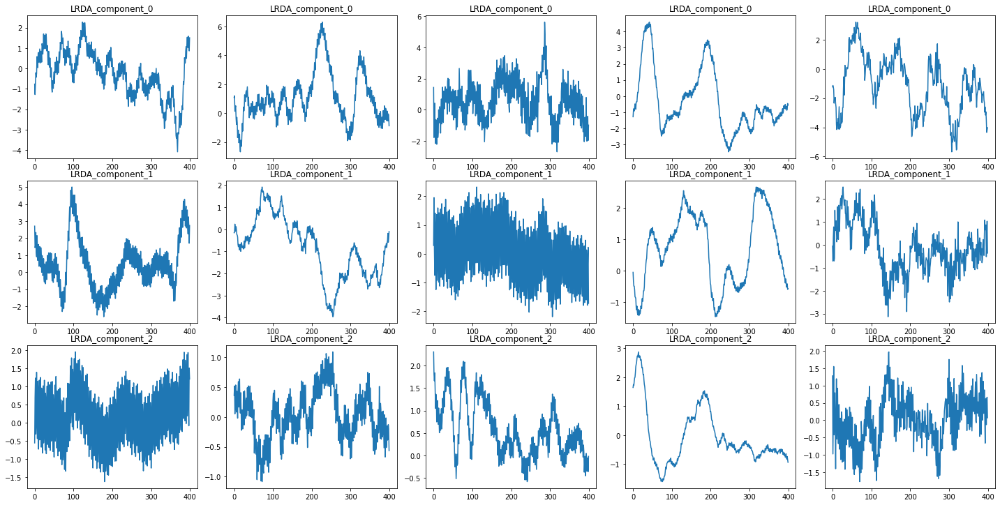

In [51]:
sub_eeg_list = [lrda_q1_pca1[0:400], lrda_q1_pca2[0:400], lrda_q1_pca3[0:400],
                lrda_q1_pca4[0:400], lrda_q1_pca5[0:400]]
activity_signal_plots(sub_eeg_list, ['LRDA'], components, 10, 20)

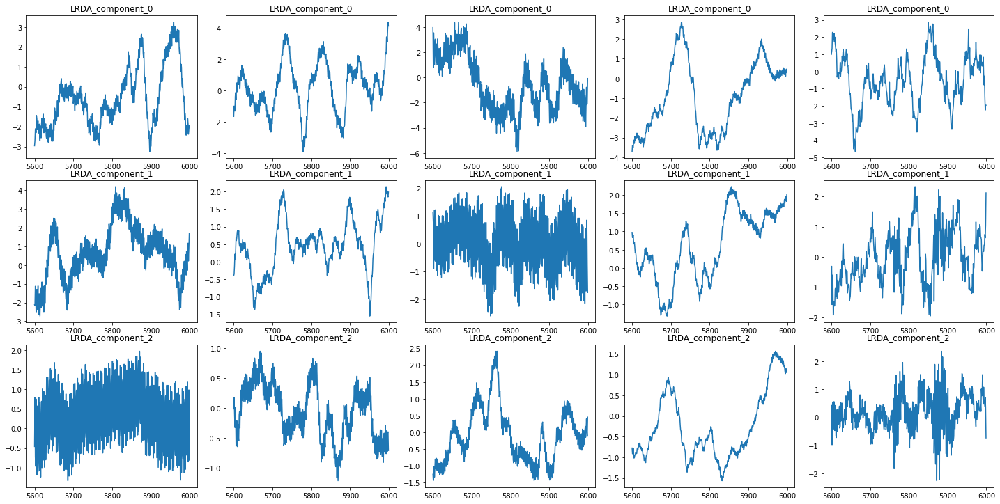

In [52]:
sub_eeg_list = [lrda_q1_pca1[5600:6000], lrda_q1_pca2[5600:6000], lrda_q1_pca3[5600:6000],
                lrda_q1_pca4[5600:6000], lrda_q1_pca5[5600:6000]]
activity_signal_plots(sub_eeg_list, ['LRDA'], components, 10, 20)

##### LRDA Q2

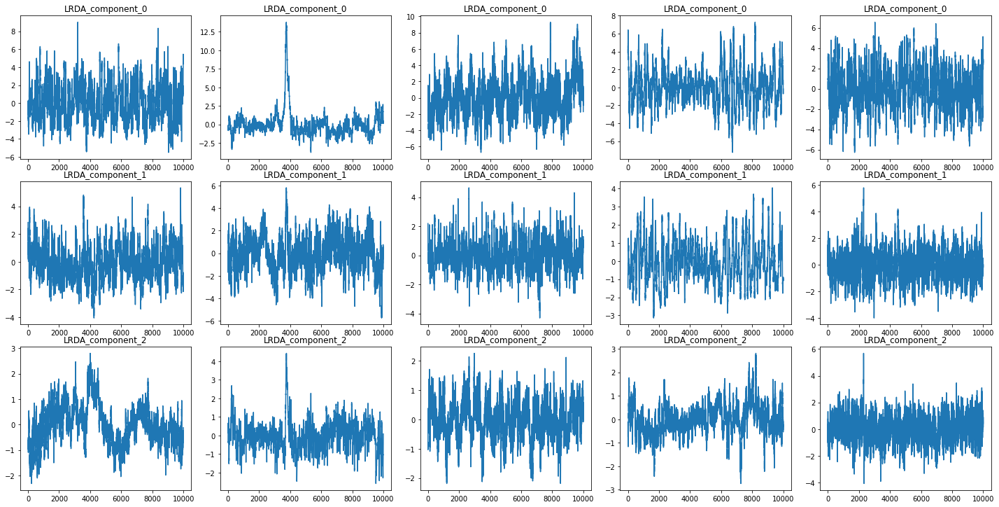

In [53]:
lrda_q2_pca1, lrda_ratio1 = pca_function(scale(lrda_df, lrda_random[0]), group1_q2, 3)
lrda_q2_pca2, lrda_ratio2 = pca_function(scale(lrda_df, lrda_random[1]), group1_q2, 3)
lrda_q2_pca3, lrda_ratio3 = pca_function(scale(lrda_df, lrda_random[2]), group1_q2, 3)
lrda_q2_pca4, lrda_ratio4 = pca_function(scale(lrda_df, lrda_random[3]), group1_q2, 3)
lrda_q2_pca5, lrda_ratio5 = pca_function(scale(lrda_df, lrda_random[4]), group1_q2, 3)

components = lrda_q2_pca1.columns

sub_eeg_list = [lrda_q2_pca1, lrda_q2_pca2, lrda_q2_pca3, lrda_q2_pca4, lrda_q2_pca5]
activity_signal_plots(sub_eeg_list, ['LRDA'], components, 10, 20)

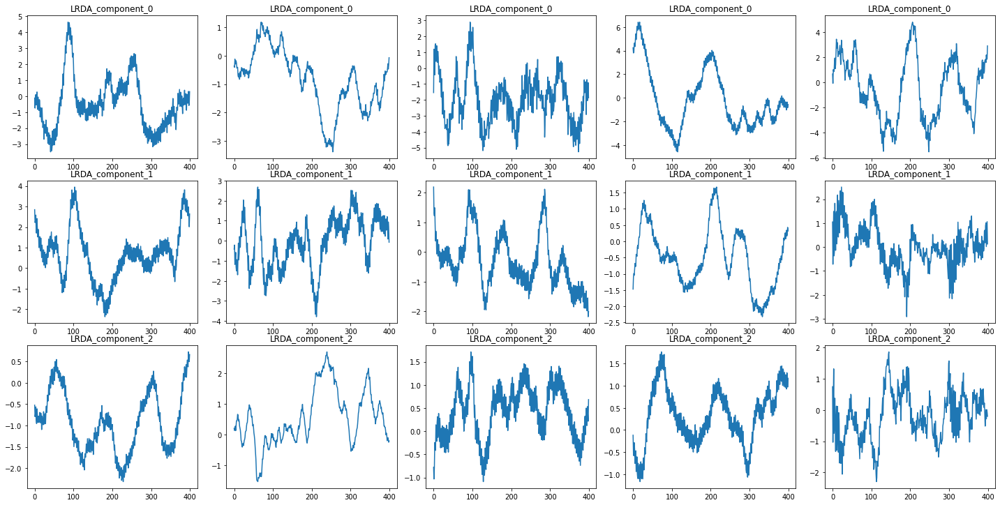

In [54]:
sub_eeg_list = [lrda_q2_pca1[0:400], lrda_q2_pca2[0:400], lrda_q2_pca3[0:400],
                lrda_q2_pca4[0:400], lrda_q2_pca5[0:400]]
activity_signal_plots(sub_eeg_list, ['LRDA'], components, 10, 20)

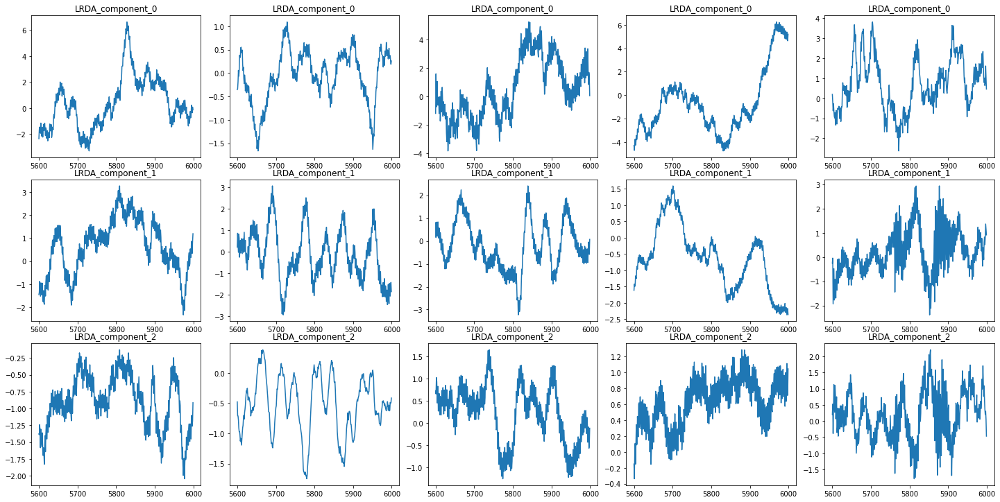

In [55]:
sub_eeg_list = [lrda_q2_pca1[5600:6000], lrda_q2_pca2[5600:6000], lrda_q2_pca3[5600:6000],
                lrda_q2_pca4[5600:6000], lrda_q2_pca5[5600:6000]]
activity_signal_plots(sub_eeg_list, ['LRDA'], components, 10, 20)

##### LRDA Q3

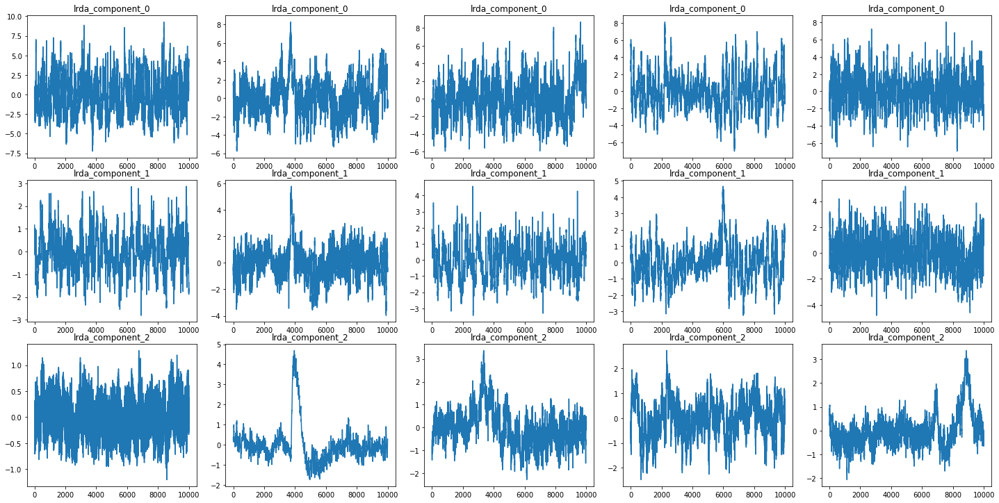

In [56]:
lrda_q3_pca1, lrda_ratio1 = pca_function(scale(lrda_df, lrda_random[0]), group1_q3, 3)
lrda_q3_pca2, lrda_ratio2 = pca_function(scale(lrda_df, lrda_random[1]), group1_q3, 3)
lrda_q3_pca3, lrda_ratio3 = pca_function(scale(lrda_df, lrda_random[2]), group1_q3, 3)
lrda_q3_pca4, lrda_ratio4 = pca_function(scale(lrda_df, lrda_random[3]), group1_q3, 3)
lrda_q3_pca5, lrda_ratio5 = pca_function(scale(lrda_df, lrda_random[4]), group1_q3, 3)

components = lrda_q3_pca1.columns

sub_eeg_list = [lrda_q3_pca1, lrda_q3_pca2, lrda_q3_pca3, lrda_q3_pca4, lrda_q3_pca5]
activity_signal_plots(sub_eeg_list, ['lrda'], components, 10, 20)

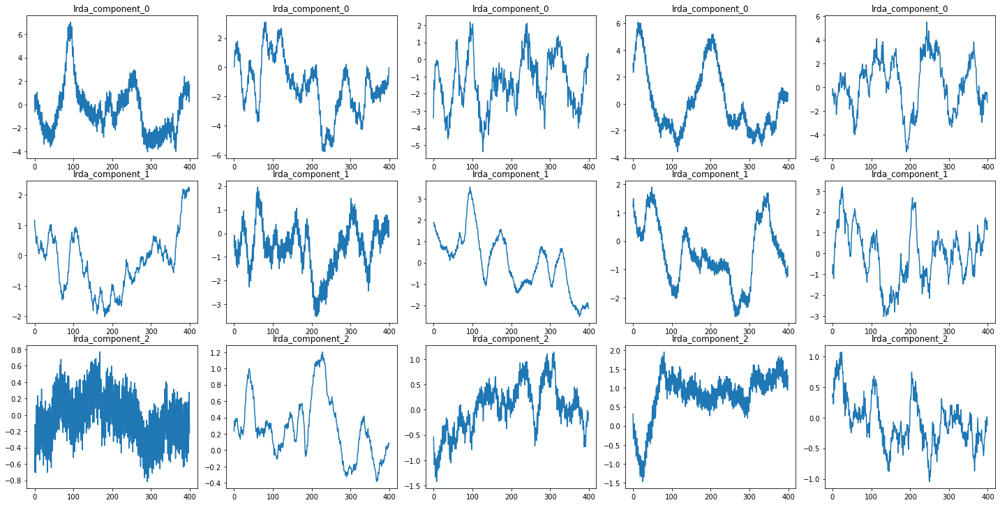

In [57]:
sub_eeg_list = [lrda_q3_pca1[0:400], lrda_q3_pca2[0:400], lrda_q3_pca3[0:400],
                lrda_q3_pca4[0:400], lrda_q3_pca5[0:400]]
activity_signal_plots(sub_eeg_list, ['lrda'], components, 10, 20)

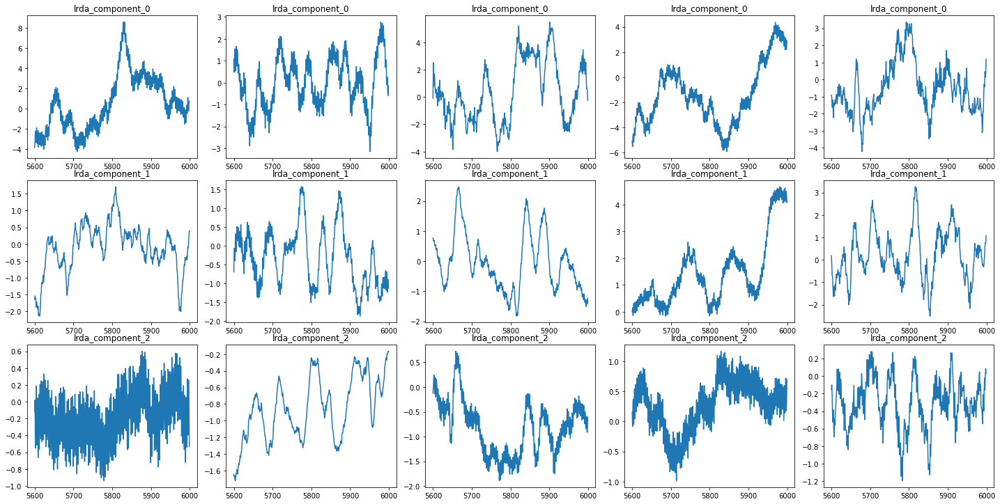

In [58]:
sub_eeg_list = [lrda_q3_pca1[5600:6000], lrda_q3_pca2[5600:6000], lrda_q3_pca3[5600:6000],
                lrda_q3_pca4[5600:6000], lrda_q3_pca5[5600:6000]]
activity_signal_plots(sub_eeg_list, ['lrda'], components, 10, 20)

##### LRDA Q4

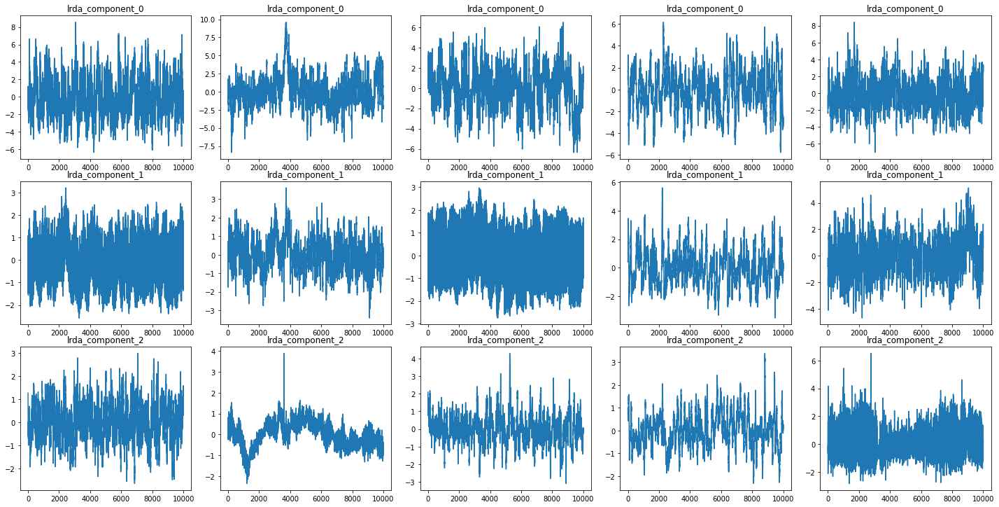

In [59]:
lrda_q4_pca1, lrda_ratio1 = pca_function(scale(lrda_df, lrda_random[0]), group1_q4, 3)
lrda_q4_pca2, lrda_ratio2 = pca_function(scale(lrda_df, lrda_random[1]), group1_q4, 3)
lrda_q4_pca3, lrda_ratio3 = pca_function(scale(lrda_df, lrda_random[2]), group1_q4, 3)
lrda_q4_pca4, lrda_ratio4 = pca_function(scale(lrda_df, lrda_random[3]), group1_q4, 3)
lrda_q4_pca5, lrda_ratio5 = pca_function(scale(lrda_df, lrda_random[4]), group1_q4, 3)

components = lrda_q4_pca1.columns

sub_eeg_list = [lrda_q4_pca1, lrda_q4_pca2, lrda_q4_pca3, lrda_q4_pca4, lrda_q4_pca5]
activity_signal_plots(sub_eeg_list, ['lrda'], components, 10, 20)

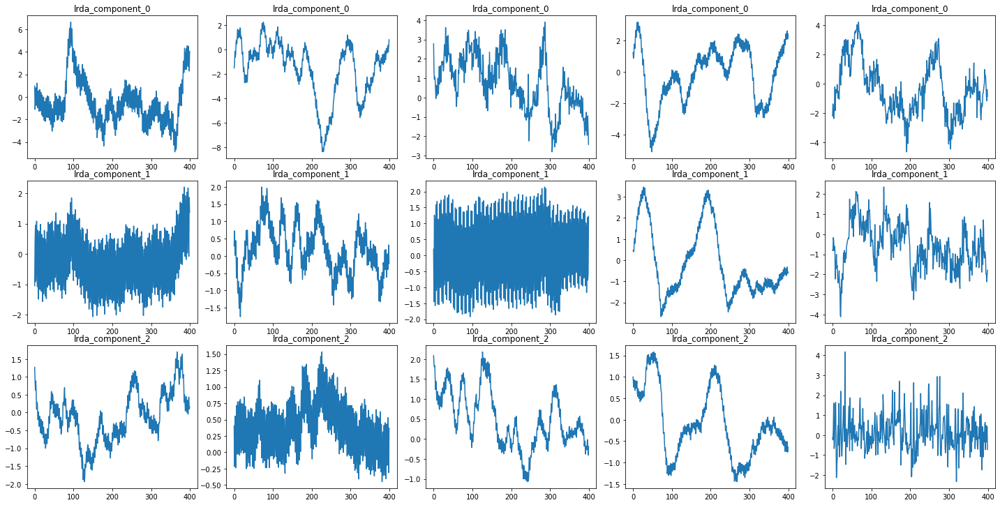

In [60]:
sub_eeg_list = [lrda_q4_pca1[0:400], lrda_q4_pca2[0:400], lrda_q4_pca3[0:400],
                lrda_q4_pca4[0:400], lrda_q4_pca5[0:400]]
activity_signal_plots(sub_eeg_list, ['lrda'], components, 10, 20)

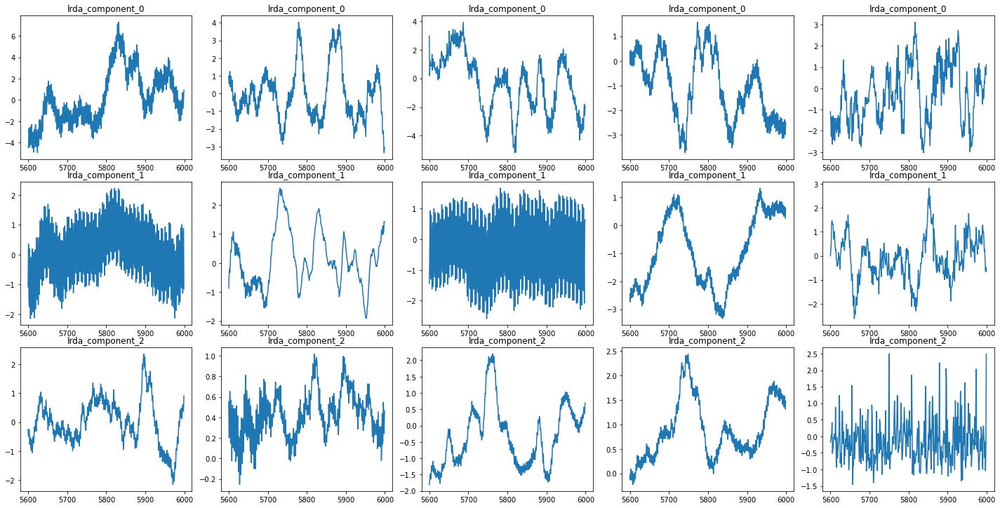

In [61]:
sub_eeg_list = [lrda_q4_pca1[5600:6000], lrda_q4_pca2[5600:6000], lrda_q4_pca3[5600:6000],
                lrda_q4_pca4[5600:6000], lrda_q4_pca5[5600:6000]]
activity_signal_plots(sub_eeg_list, ['lrda'], components, 10, 20)

##### GRDA Q1

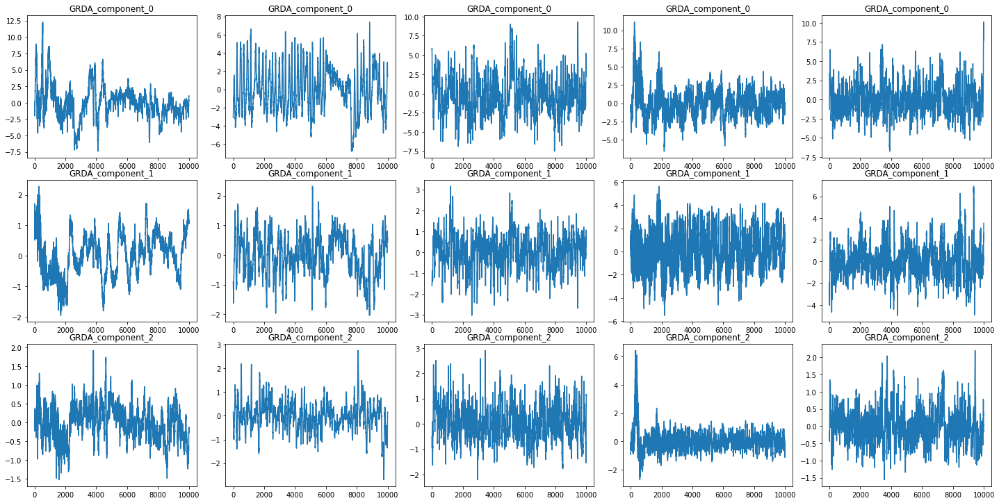

In [62]:
grda_indexes = [i for i in range(grda_df.shape[0])]
grda_random = np.random.choice(grda_indexes, size = 5, replace = False)
grda_q1_pca1, grda_ratio1 = pca_function(scale(grda_df, grda_random[0]), group1_q1, 3)
grda_q1_pca2, grda_ratio2 = pca_function(scale(grda_df, grda_random[1]), group1_q1, 3)
grda_q1_pca3, grda_ratio3 = pca_function(scale(grda_df, grda_random[2]), group1_q1, 3)
grda_q1_pca4, grda_ratio4 = pca_function(scale(grda_df, grda_random[3]), group1_q1, 3)
grda_q1_pca5, grda_ratio5 = pca_function(scale(grda_df, grda_random[4]), group1_q1, 3)
components = grda_q1_pca1.columns
sub_eeg_list = [grda_q1_pca1, grda_q1_pca2, grda_q1_pca3, grda_q1_pca4, grda_q1_pca5]
activity_signal_plots(sub_eeg_list, ['GRDA'], components, 10, 20)

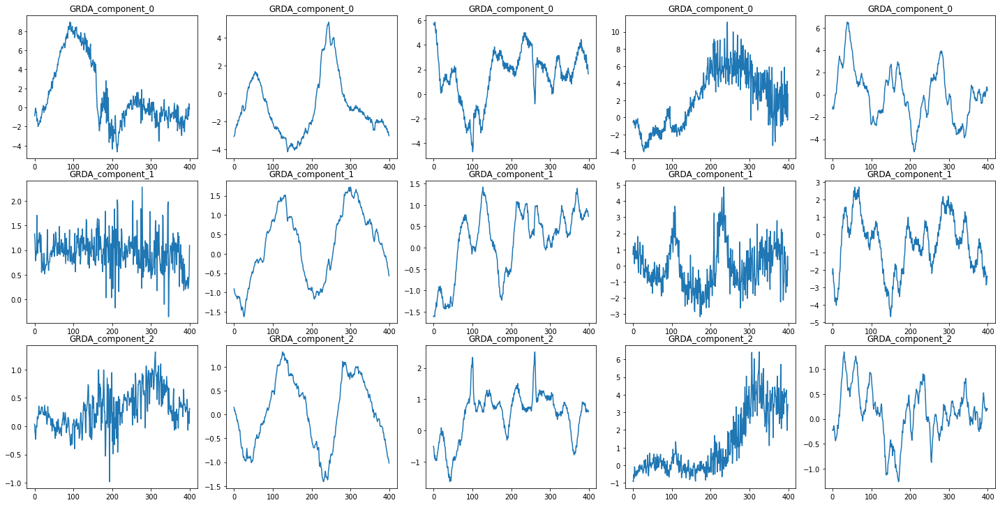

In [63]:
sub_eeg_list = [grda_q1_pca1[0:400], grda_q1_pca2[0:400], grda_q1_pca3[0:400],
                grda_q1_pca4[0:400], grda_q1_pca5[0:400]]
activity_signal_plots(sub_eeg_list, ['GRDA'], components, 10, 20)

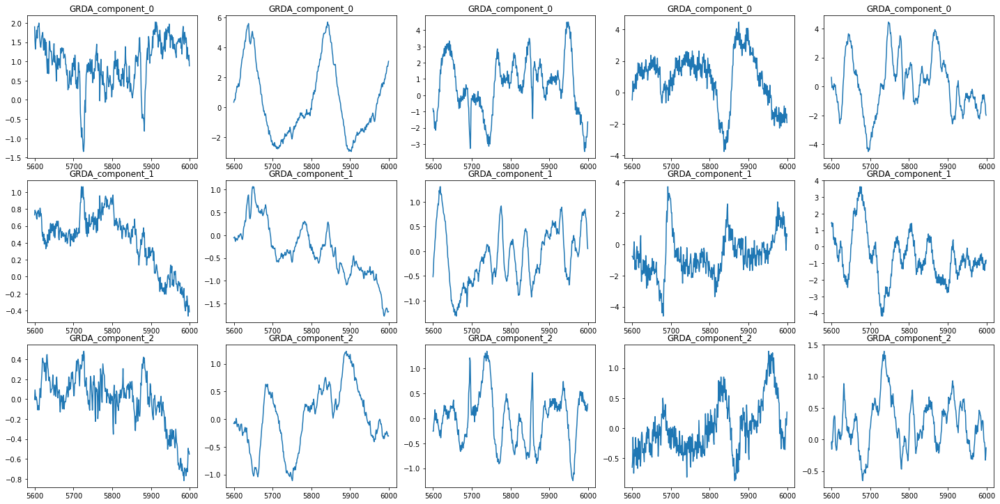

In [64]:
sub_eeg_list = [grda_q1_pca1[5600:6000], grda_q1_pca2[5600:6000], grda_q1_pca3[5600:6000],
                grda_q1_pca4[5600:6000], grda_q1_pca5[5600:6000]]
activity_signal_plots(sub_eeg_list, ['GRDA'], components, 10, 20)

##### GRDA Q2

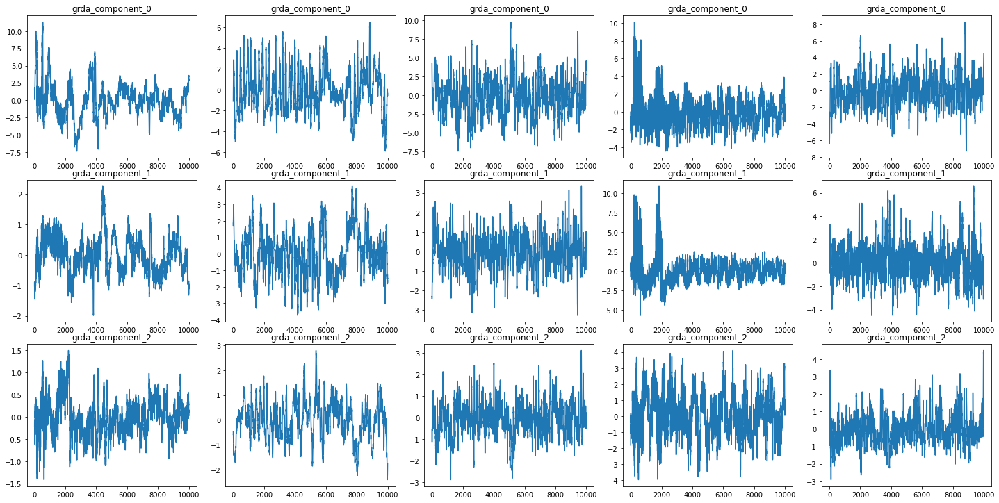

In [65]:
grda_q2_pca1, grda_ratio1 = pca_function(scale(grda_df, grda_random[0]), group1_q2, 3)
grda_q2_pca2, grda_ratio2 = pca_function(scale(grda_df, grda_random[1]), group1_q2, 3)
grda_q2_pca3, grda_ratio3 = pca_function(scale(grda_df, grda_random[2]), group1_q2, 3)
grda_q2_pca4, grda_ratio4 = pca_function(scale(grda_df, grda_random[3]), group1_q2, 3)
grda_q2_pca5, grda_ratio5 = pca_function(scale(grda_df, grda_random[4]), group1_q2, 3)

components = grda_q2_pca1.columns

sub_eeg_list = [grda_q2_pca1, grda_q2_pca2, grda_q2_pca3, grda_q2_pca4, grda_q2_pca5]
activity_signal_plots(sub_eeg_list, ['grda'], components, 10, 20)

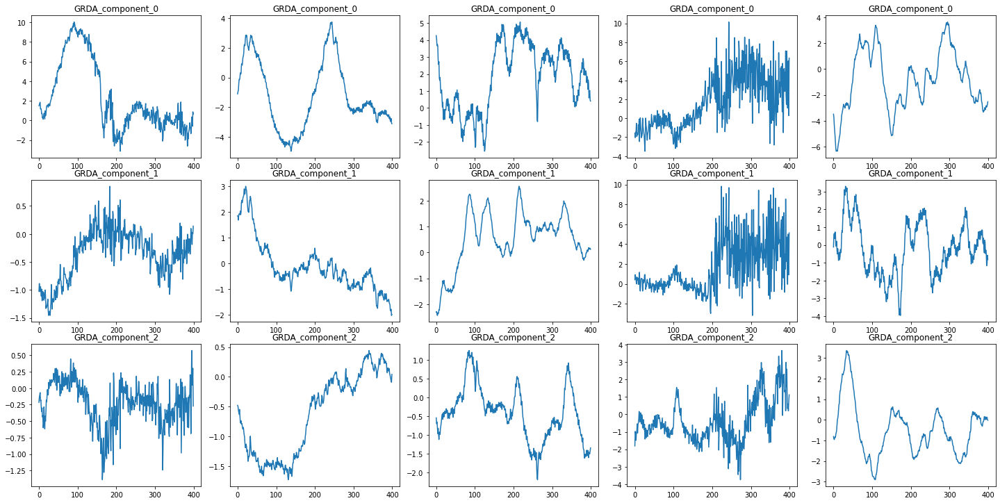

In [66]:
sub_eeg_list = [grda_q2_pca1[0:400], grda_q2_pca2[0:400], grda_q2_pca3[0:400],
                grda_q2_pca4[0:400], grda_q2_pca5[0:400]]
activity_signal_plots(sub_eeg_list, ['GRDA'], components, 10, 20)

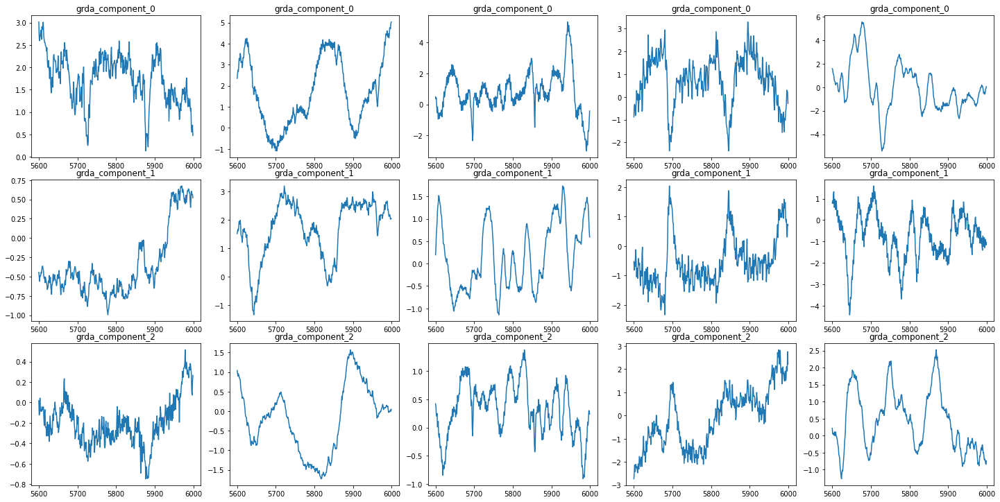

In [67]:
sub_eeg_list = [grda_q2_pca1[5600:6000], grda_q2_pca2[5600:6000], grda_q2_pca3[5600:6000],
                grda_q2_pca4[5600:6000], grda_q2_pca5[5600:6000]]
activity_signal_plots(sub_eeg_list, ['grda'], components, 10, 20)

##### GRDA Q3

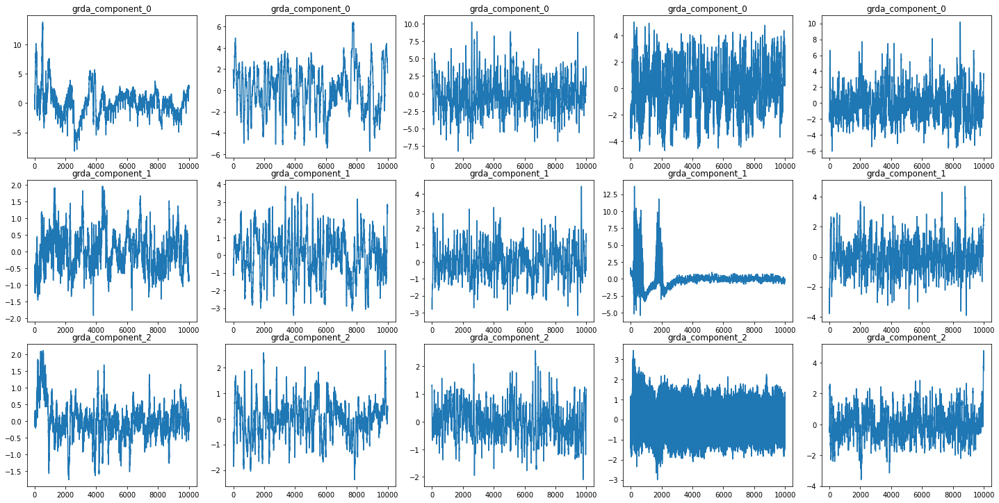

In [68]:
grda_q3_pca1, grda_ratio1 = pca_function(scale(grda_df, grda_random[0]), group1_q3, 3)
grda_q3_pca2, grda_ratio2 = pca_function(scale(grda_df, grda_random[1]), group1_q3, 3)
grda_q3_pca3, grda_ratio3 = pca_function(scale(grda_df, grda_random[2]), group1_q3, 3)
grda_q3_pca4, grda_ratio4 = pca_function(scale(grda_df, grda_random[3]), group1_q3, 3)
grda_q3_pca5, grda_ratio5 = pca_function(scale(grda_df, grda_random[4]), group1_q3, 3)

components = grda_q3_pca1.columns

sub_eeg_list = [grda_q3_pca1, grda_q3_pca2, grda_q3_pca3, grda_q3_pca4, grda_q3_pca5]
activity_signal_plots(sub_eeg_list, ['grda'], components, 10, 20)

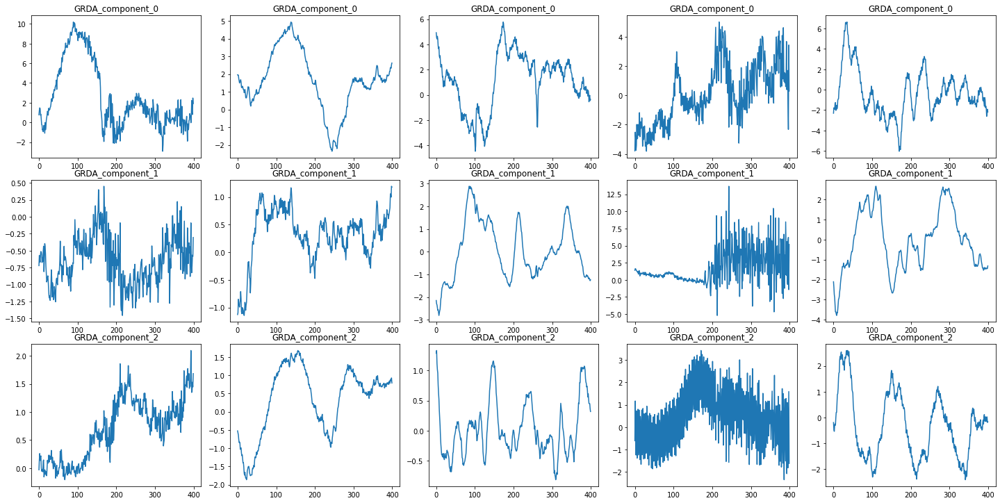

In [69]:
sub_eeg_list = [grda_q3_pca1[0:400], grda_q3_pca2[0:400], grda_q3_pca3[0:400],
                grda_q3_pca4[0:400], grda_q3_pca5[0:400]]
activity_signal_plots(sub_eeg_list, ['GRDA'], components, 10, 20)

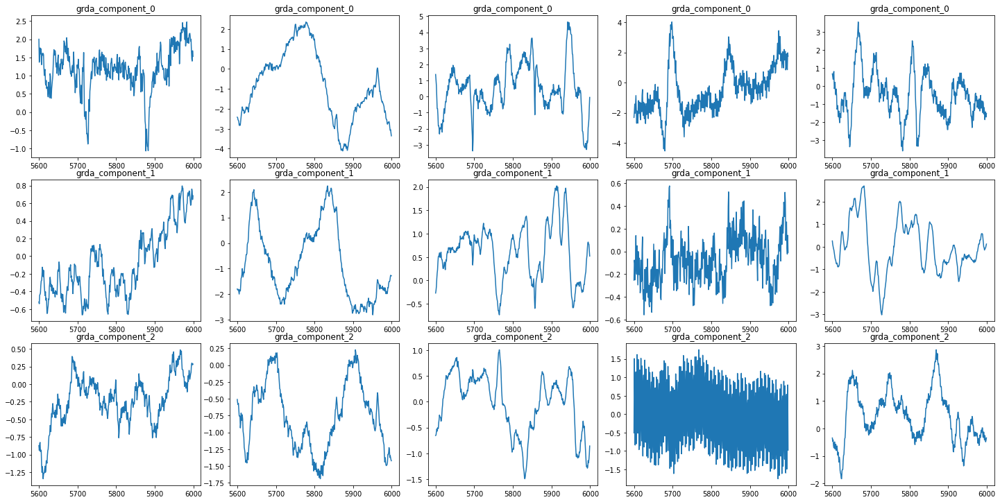

In [70]:
sub_eeg_list = [grda_q3_pca1[5600:6000], grda_q3_pca2[5600:6000], grda_q3_pca3[5600:6000],
                grda_q3_pca4[5600:6000], grda_q3_pca5[5600:6000]]
activity_signal_plots(sub_eeg_list, ['grda'], components, 10, 20)

##### GRDA Q4

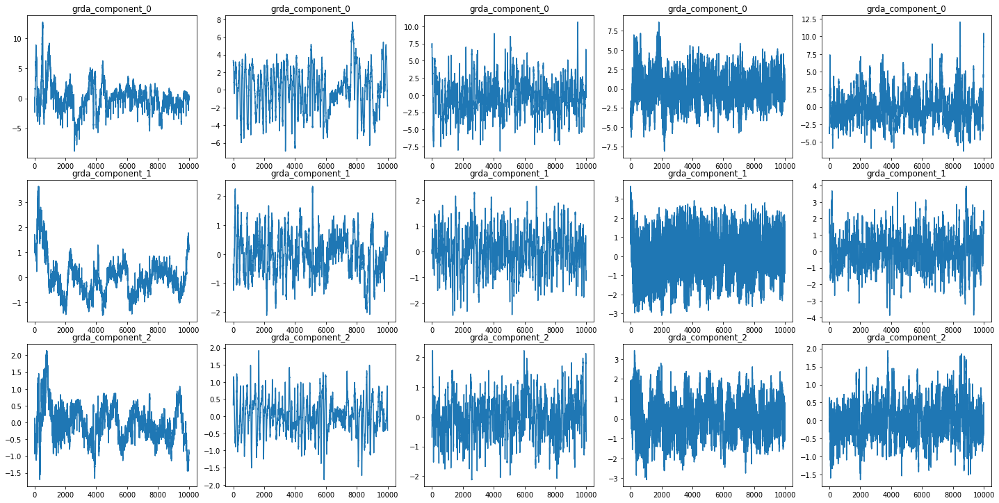

In [71]:
grda_q4_pca1, grda_ratio1 = pca_function(scale(grda_df, grda_random[0]), group1_q4, 3)
grda_q4_pca2, grda_ratio2 = pca_function(scale(grda_df, grda_random[1]), group1_q4, 3)
grda_q4_pca3, grda_ratio3 = pca_function(scale(grda_df, grda_random[2]), group1_q4, 3)
grda_q4_pca4, grda_ratio4 = pca_function(scale(grda_df, grda_random[3]), group1_q4, 3)
grda_q4_pca5, grda_ratio5 = pca_function(scale(grda_df, grda_random[4]), group1_q4, 3)

components = grda_q4_pca1.columns

sub_eeg_list = [grda_q4_pca1, grda_q4_pca2, grda_q4_pca3, grda_q4_pca4, grda_q4_pca5]
activity_signal_plots(sub_eeg_list, ['grda'], components, 10, 20)

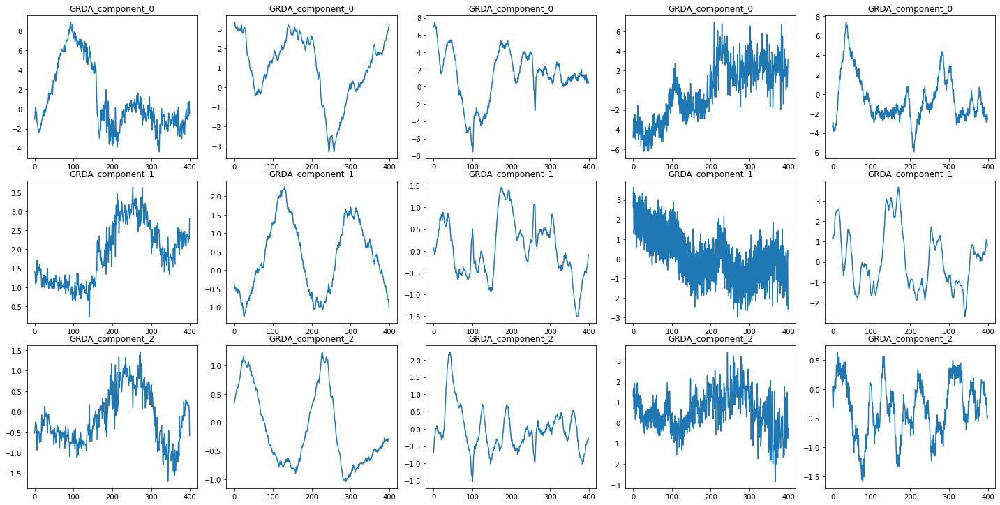

In [72]:
sub_eeg_list = [grda_q4_pca1[0:400], grda_q4_pca2[0:400], grda_q4_pca3[0:400],
                grda_q4_pca4[0:400], grda_q4_pca5[0:400]]
activity_signal_plots(sub_eeg_list, ['GRDA'], components, 10, 20)

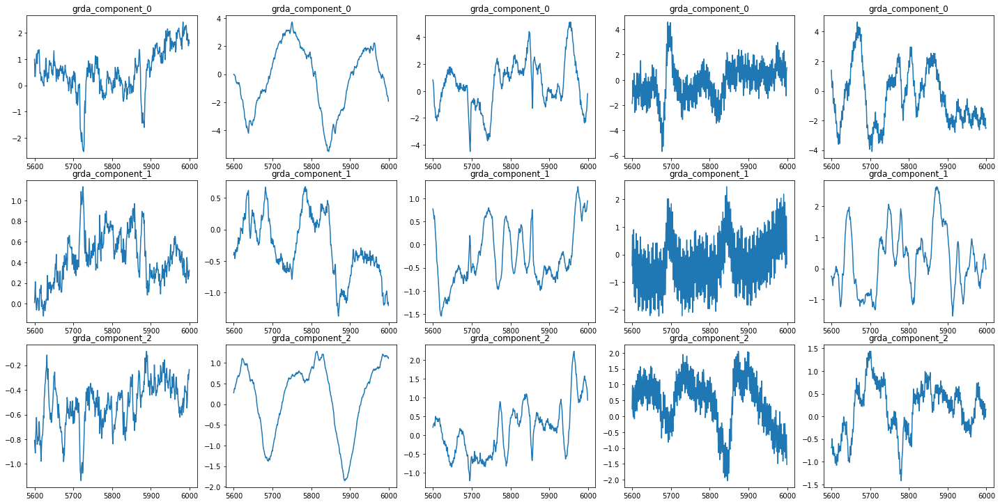

In [73]:
sub_eeg_list = [grda_q4_pca1[5600:6000], grda_q4_pca2[5600:6000], grda_q4_pca3[5600:6000],
                grda_q4_pca4[5600:6000], grda_q4_pca5[5600:6000]]
activity_signal_plots(sub_eeg_list, ['grda'], components, 10, 20)

##### Other Q1

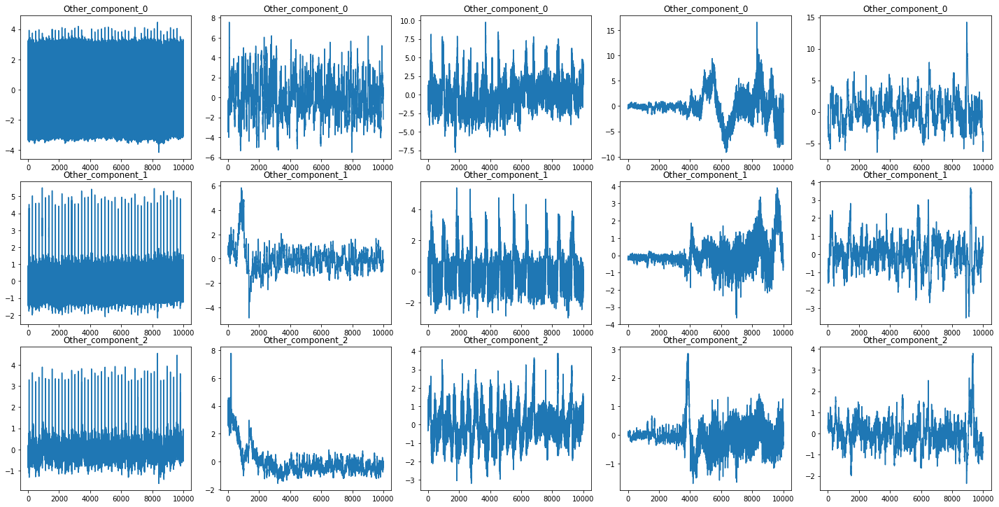

In [74]:
other_indexes = [i for i in range(other_df.shape[0])]
other_random = np.random.choice(other_indexes, size = 5, replace = False)
other_q1_pca1, other_ratio1 = pca_function(scale(other_df, other_random[0]), group1_q1, 3)
other_q1_pca2, other_ratio2 = pca_function(scale(other_df, other_random[1]), group1_q1, 3)
other_q1_pca3, other_ratio3 = pca_function(scale(other_df, other_random[2]), group1_q1, 3)
other_q1_pca4, other_ratio4 = pca_function(scale(other_df, other_random[3]), group1_q1, 3)
other_q1_pca5, other_ratio5 = pca_function(scale(other_df, other_random[4]), group1_q1, 3)
components = other_q1_pca1.columns
sub_eeg_list = [other_q1_pca1, other_q1_pca2, other_q1_pca3, other_q1_pca4, other_q1_pca5]
activity_signal_plots(sub_eeg_list, ['Other'], components, 10, 20)

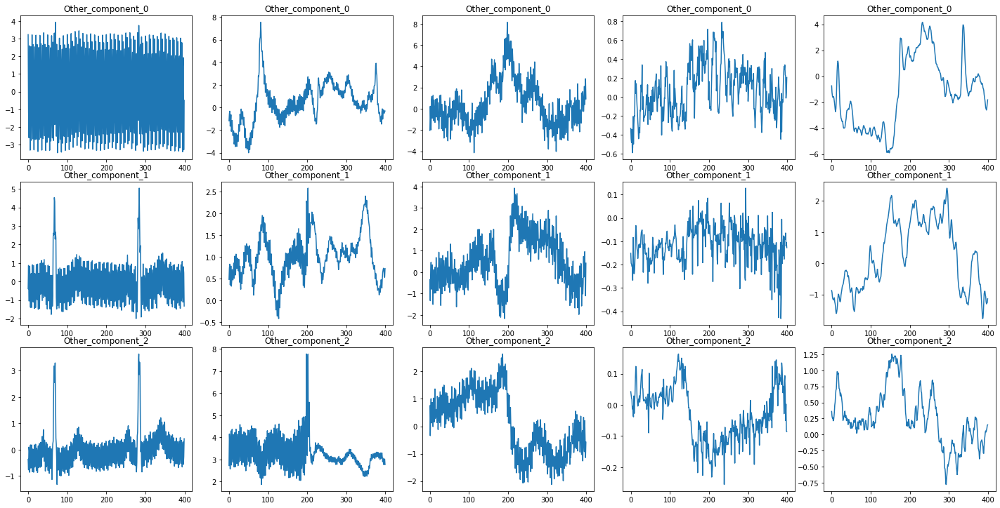

In [75]:
sub_eeg_list = [other_q1_pca1[0:400], other_q1_pca2[0:400], other_q1_pca3[0:400],
                other_q1_pca4[0:400], other_q1_pca5[0:400]]
activity_signal_plots(sub_eeg_list, ['Other'], components, 10, 20)

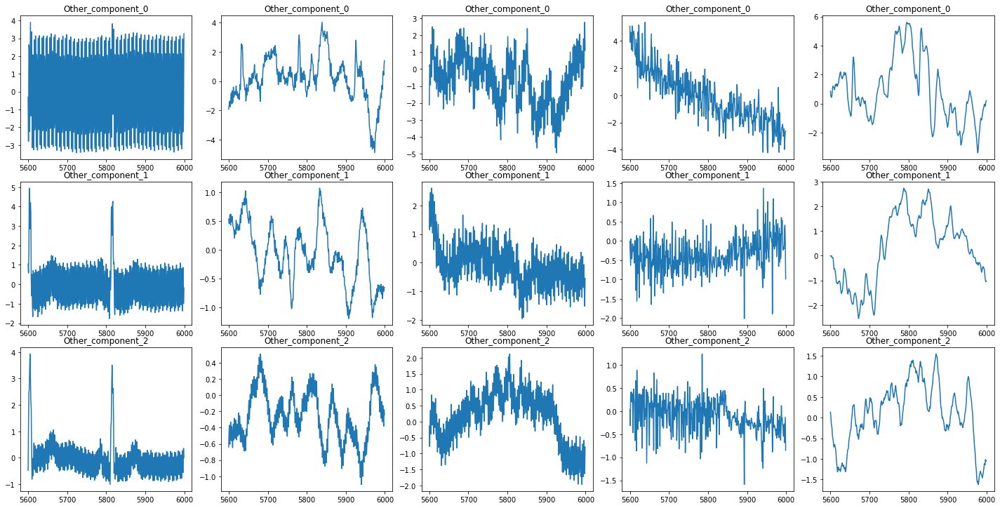

In [76]:
sub_eeg_list = [other_q1_pca1[5600:6000], other_q1_pca2[5600:6000], other_q1_pca3[5600:6000],
                other_q1_pca4[5600:6000], other_q1_pca5[5600:6000]]
activity_signal_plots(sub_eeg_list, ['Other'], components, 10, 20)

##### Other Q2

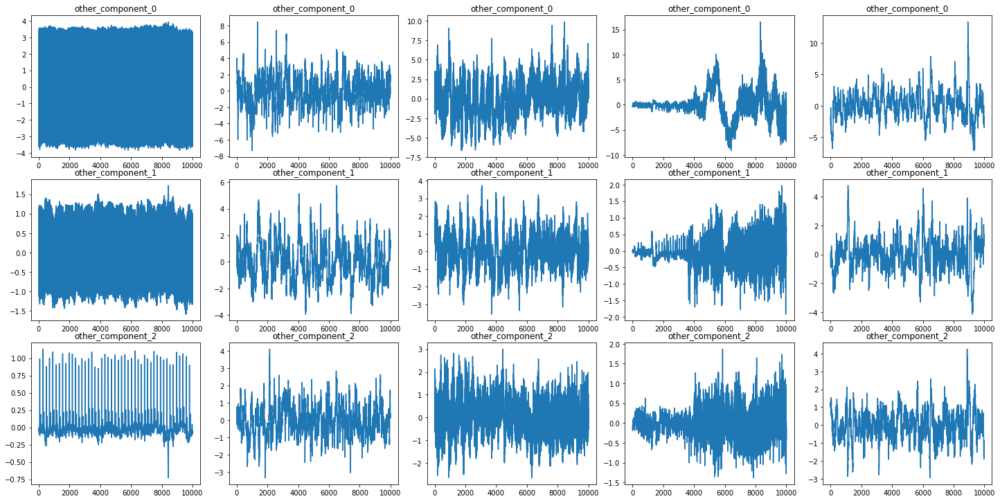

In [77]:
other_q2_pca1, other_ratio1 = pca_function(scale(other_df, other_random[0]), group1_q2, 3)
other_q2_pca2, other_ratio2 = pca_function(scale(other_df, other_random[1]), group1_q2, 3)
other_q2_pca3, other_ratio3 = pca_function(scale(other_df, other_random[2]), group1_q2, 3)
other_q2_pca4, other_ratio4 = pca_function(scale(other_df, other_random[3]), group1_q2, 3)
other_q2_pca5, other_ratio5 = pca_function(scale(other_df, other_random[4]), group1_q2, 3)

components = other_q2_pca1.columns

sub_eeg_list = [other_q2_pca1, other_q2_pca2, other_q2_pca3, other_q2_pca4, other_q2_pca5]
activity_signal_plots(sub_eeg_list, ['other'], components, 10, 20)

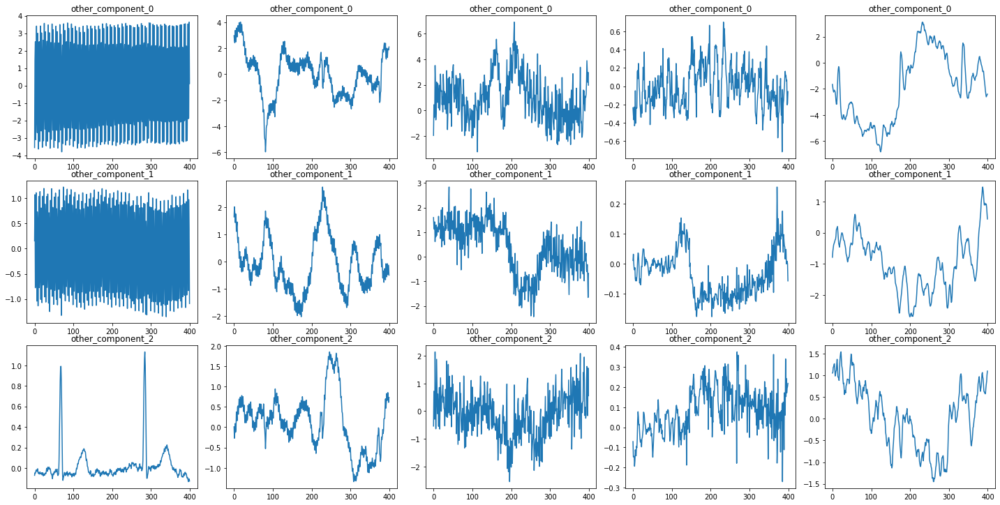

In [78]:
sub_eeg_list = [other_q2_pca1[0:400], other_q2_pca2[0:400], other_q2_pca3[0:400],
                other_q2_pca4[0:400], other_q2_pca5[0:400]]
activity_signal_plots(sub_eeg_list, ['other'], components, 10, 20)

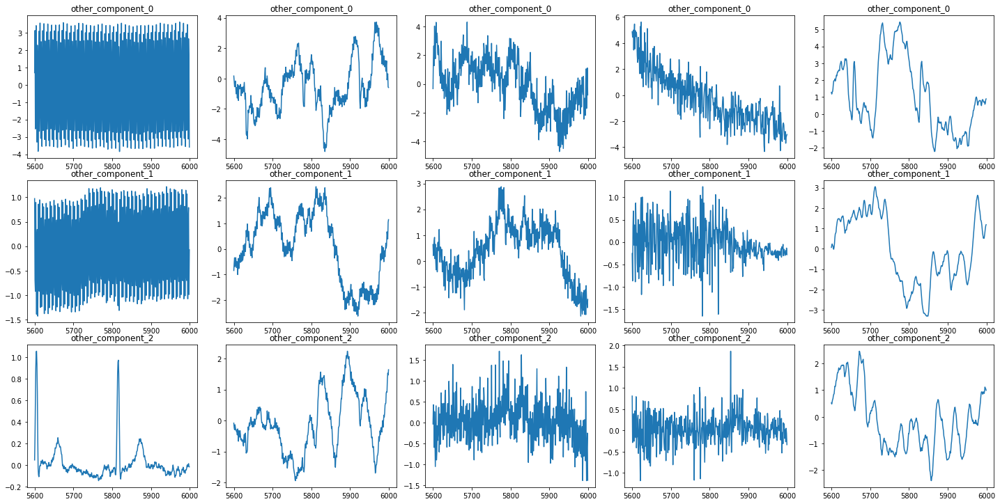

In [79]:
sub_eeg_list = [other_q2_pca1[5600:6000], other_q2_pca2[5600:6000], other_q2_pca3[5600:6000],
                other_q2_pca4[5600:6000], other_q2_pca5[5600:6000]]
activity_signal_plots(sub_eeg_list, ['other'], components, 10, 20)

##### Other Q3

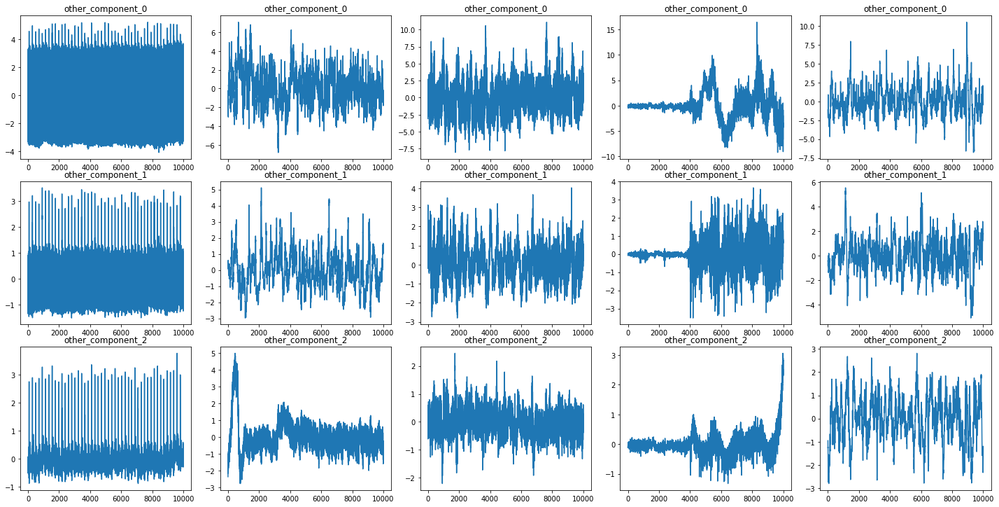

In [80]:
other_q3_pca1, other_ratio1 = pca_function(scale(other_df, other_random[0]), group1_q3, 3)
other_q3_pca2, other_ratio2 = pca_function(scale(other_df, other_random[1]), group1_q3, 3)
other_q3_pca3, other_ratio3 = pca_function(scale(other_df, other_random[2]), group1_q3, 3)
other_q3_pca4, other_ratio4 = pca_function(scale(other_df, other_random[3]), group1_q3, 3)
other_q3_pca5, other_ratio5 = pca_function(scale(other_df, other_random[4]), group1_q3, 3)

components = other_q3_pca1.columns

sub_eeg_list = [other_q3_pca1, other_q3_pca2, other_q3_pca3, other_q3_pca4, other_q3_pca5]
activity_signal_plots(sub_eeg_list, ['other'], components, 10, 20)

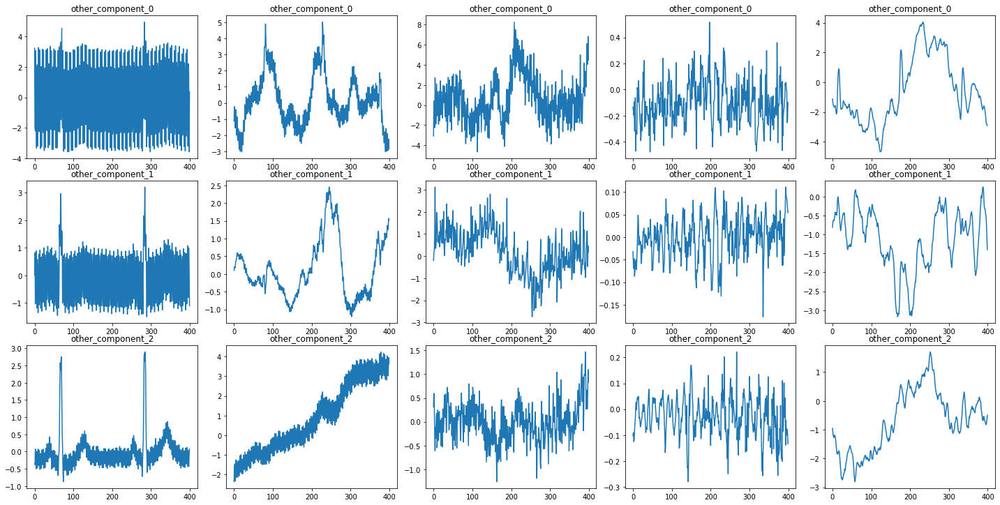

In [81]:
sub_eeg_list = [other_q3_pca1[0:400], other_q3_pca2[0:400], other_q3_pca3[0:400],
                other_q3_pca4[0:400], other_q3_pca5[0:400]]
activity_signal_plots(sub_eeg_list, ['other'], components, 10, 20)

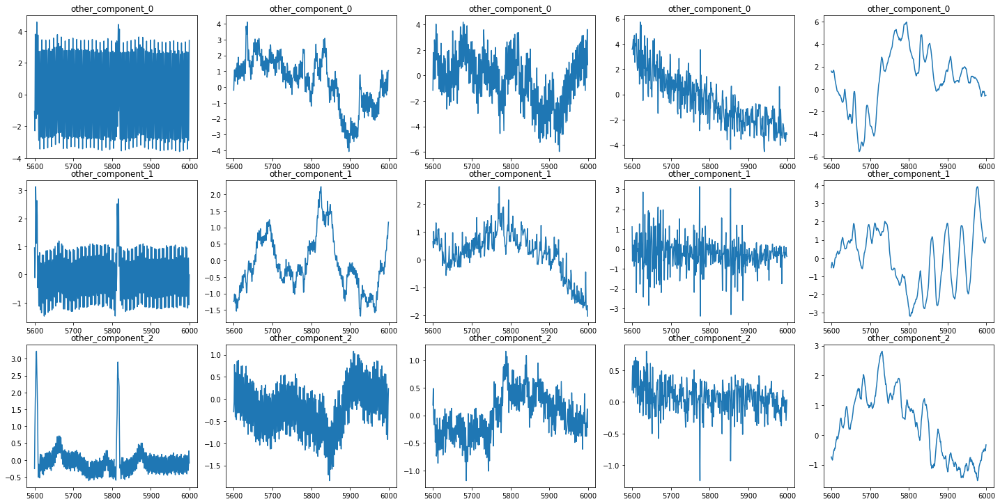

In [82]:
sub_eeg_list = [other_q3_pca1[5600:6000], other_q3_pca2[5600:6000], other_q3_pca3[5600:6000],
                other_q3_pca4[5600:6000], other_q3_pca5[5600:6000]]
activity_signal_plots(sub_eeg_list, ['other'], components, 10, 20)

##### Other Q4

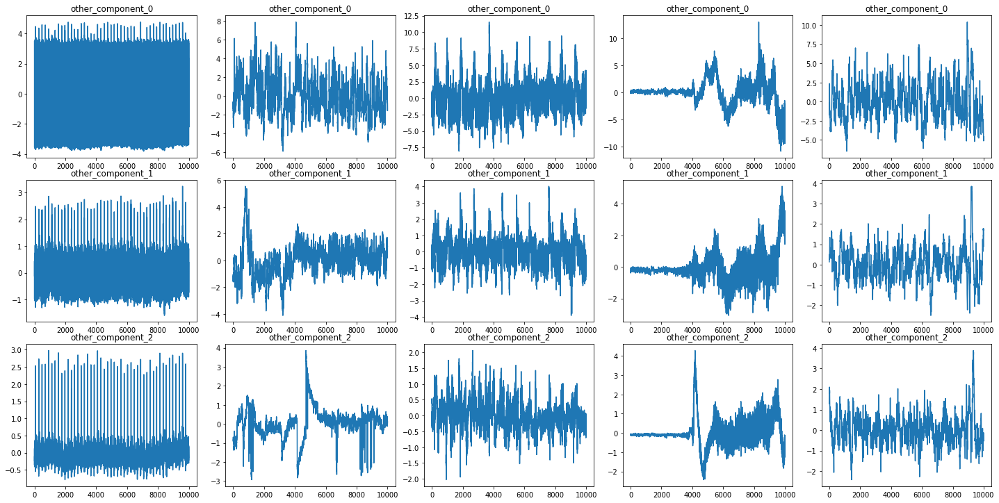

In [83]:
other_q4_pca1, other_ratio1 = pca_function(scale(other_df, other_random[0]), group1_q4, 3)
other_q4_pca2, other_ratio2 = pca_function(scale(other_df, other_random[1]), group1_q4, 3)
other_q4_pca3, other_ratio3 = pca_function(scale(other_df, other_random[2]), group1_q4, 3)
other_q4_pca4, other_ratio4 = pca_function(scale(other_df, other_random[3]), group1_q4, 3)
other_q4_pca5, other_ratio5 = pca_function(scale(other_df, other_random[4]), group1_q4, 3)

components = other_q4_pca1.columns

sub_eeg_list = [other_q4_pca1, other_q4_pca2, other_q4_pca3, other_q4_pca4, other_q4_pca5]
activity_signal_plots(sub_eeg_list, ['other'], components, 10, 20)

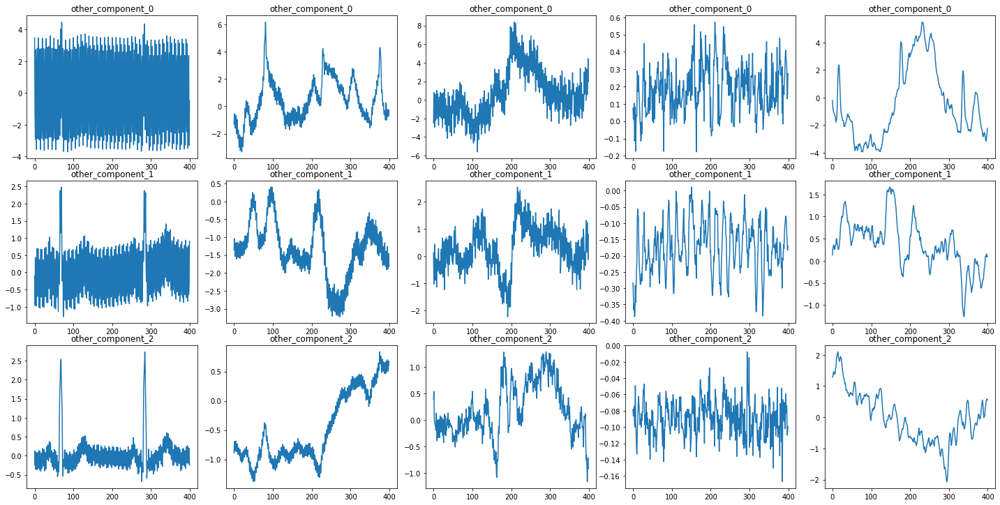

In [84]:
sub_eeg_list = [other_q4_pca1[0:400], other_q4_pca2[0:400], other_q4_pca3[0:400],
                other_q4_pca4[0:400], other_q4_pca5[0:400]]
activity_signal_plots(sub_eeg_list, ['other'], components, 10, 20)

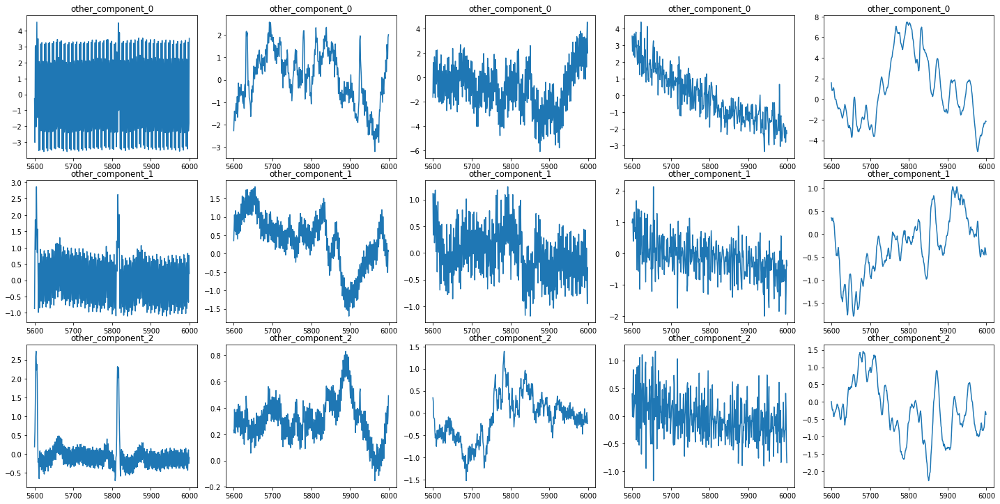

In [85]:
sub_eeg_list = [other_q4_pca1[5600:6000], other_q4_pca2[5600:6000], other_q4_pca3[5600:6000],
                other_q4_pca4[5600:6000], other_q4_pca5[5600:6000]]
activity_signal_plots(sub_eeg_list, ['other'], components, 10, 20)

##### Random Indexes by Activity Type  
  
Want to be able to keep track of these because I'm splitting this up across at least four different notebooks. Doing all of the plots for each grouping and activity type has made this too long for one notebook.

In [86]:
s_randoms = [int(str(i)) for i in seizure_random]
lpd_randoms = [int(str(i)) for i in lpd_random]
gpd_randoms = [int(str(i)) for i in gpd_random]
lrda_randoms = [int(str(i)) for i in lrda_random]
grda_randoms = [int(str(i)) for i in grda_random]
o_randoms = [int(str(i)) for i in other_random]

In [87]:
target_class = ['Seizure', 'LPD', 'GPD', 'LRDA', 'GRDA', 'Other']
random_lists = [s_randoms, lpd_randoms, gpd_randoms, lrda_randoms, grda_randoms, o_randoms]
for i in range(len(random_lists)):
    print('{}: {}'.format(target_class[i], random_lists[i]))

Seizure: [13302, 1482, 10216, 7141, 14908]
LPD: [10481, 6081, 7076, 2242, 2655]
GPD: [12798, 12012, 7877, 11331, 6194]
LRDA: [95, 12021, 11870, 9527, 4103]
GRDA: [5198, 11972, 8311, 8464, 12802]
Other: [337, 14609, 14733, 9815, 7515]
